<a href="https://colab.research.google.com/github/yarivkraus/yarivkraus/blob/main/ML_speed_dating.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install catboost
!pip install lightgbm
!pip install xgboost
!pip install ydata-profiling
!pip install scikit-learn
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import xgboost as xgb
import lightgbm as lgb
import catboost as cat
import sklearn
from ydata_profiling import ProfileReport
from sklearn.compose import ColumnTransformer, make_column_selector
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score, cross_validate, StratifiedKFold
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.linear_model import LogisticRegression, RidgeClassifier, PassiveAggressiveClassifier, Perceptron, SGDClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier, ExtraTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier, BaggingClassifier, VotingClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis, QuadraticDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.svm import LinearSVC
from sklearn.preprocessing import LabelEncoder

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.2/98.2 MB 5.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.5/359.5 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 12.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 30.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 25.2 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27080 sha256=a9699e949faa711aa379d594717f205833a88a99c6def38d7ef7f9468ef97599
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
from google.colab import drive

# Mount your Google Drive to the root directory
drive.mount('/content/drive', force_remount=True)

# Access your file using the correct path after mounting
df = pd.read_csv('/content/drive/MyDrive/Speed Dating Data.csv', encoding='latin-1')

Mounted at /content/drive


# EDA





In [ ]:
# Summary statistics

# Display summary statistics for categorical features
display("Categorical Features")
print(df.describe(include='O').T)

# Display summary statistics for numeric features
display("Numeric Features")
print(df.describe(include='number').T)

'Categorical Features'

         count unique          top freq
field     8315    259     Business  521
undergra  4914    241  UC Berkeley  107
mn_sat    3133     68     1,400.00  403
tuition   3583    115    26,908.00  241
from      8299    269     New York  522
zipcode   7314    409            0  355
income    4279    261    55,080.00  124
career    8289    367      Finance  202


'Numeric Features'

           count        mean         std  min    25%    50%    75%    max
iid       8378.0  283.675937  158.583367  1.0  154.0  281.0  407.0  552.0
id        8377.0    8.960248    5.491329  1.0    4.0    8.0   13.0   22.0
gender    8378.0    0.500597    0.500029  0.0    0.0    1.0    1.0    1.0
idg       8378.0   17.327166   10.940735  1.0    8.0   16.0   26.0   44.0
wave      8378.0   11.350919    5.995903  1.0    7.0   11.0   15.0   21.0
...          ...         ...         ...  ...    ...    ...    ...    ...
attr5_3   2016.0    6.810020    1.507341  2.0    6.0    7.0    8.0   10.0
sinc5_3   2016.0    7.615079    1.504551  2.0    7.0    8.0    9.0   10.0
intel5_3  2016.0    7.932540    1.340868  4.0    7.0    8.0    9.0   10.0
fun5_3    2016.0    7.155258    1.672787  1.0    6.0    7.0    8.0   10.0
amb5_3    2016.0    7.048611    1.717988  1.0    6.0    7.0    8.0   10.0

[186 rows x 8 columns]


## 1.0 	Meta *analysis*



In [ ]:
# @title 1.0 	Meta analysis

# Optimize data types
profile = ProfileReport(df, title="Speed Dating profile Report",
    minimal=True,  # Less explorative
    vars={"num": {"low_categorical_threshold": 0}}
)
profile.to_notebook_iframe() # Show as inline plot

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 2.0	Fields analysis

●	About the people (choose 3): gender, age, race, field of study, career, activities interests

In [ ]:
# @title 2.0 Creating a DF for (gender, age, race)
df_atp = df.copy()
df_atp = df_atp[['iid','gender', 'age', 'race' ]]
df_atp.loc[:, 'gender'] = df_atp['gender'].replace({1: 'man', 0: 'woman'})
df_atp.loc[:, 'race'] = df_atp['race'].replace({1: 'Black/African American', 2 : 'European/Caucasian-American', 3: 'Latino/Hispanic American', 4 : 'Asian/Pacific Islander/Asian-American', 5: 'Native American',6: 'Other',0: 'null'})

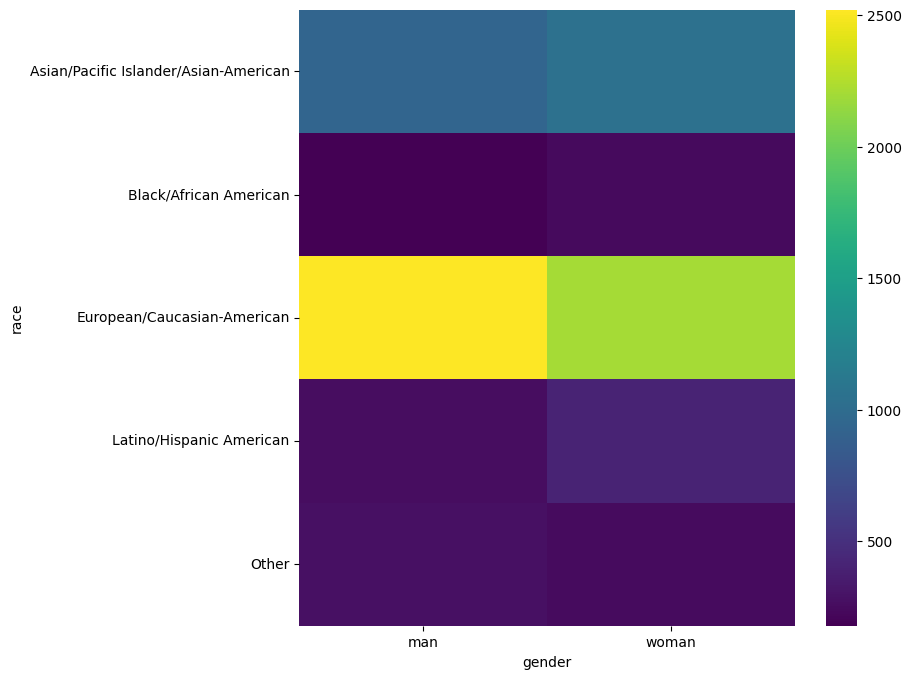

In [ ]:
# @title Gender Race Count
from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd
plt.subplots(figsize=(8, 8))
df_2dhist = pd.DataFrame({
    x_label: grp['race'].value_counts()
    for x_label, grp in df_atp.groupby('gender')
})
sns.heatmap(df_2dhist, cmap='viridis')
plt.xlabel('gender')
_ = plt.ylabel('race')

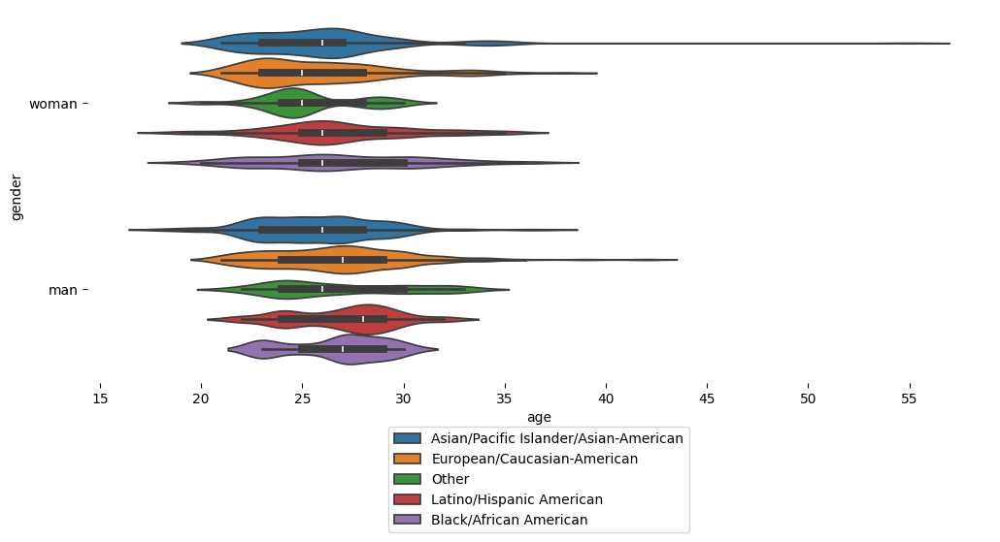

In [ ]:
# @title Gender Race Age Disply
from matplotlib import pyplot as plt
import seaborn as sns

figsize = (12, 5)
plt.figure(figsize=figsize)
sns.violinplot(data=df_atp, x='age', y='gender', inner='box', hue='race')
sns.despine(right=True, bottom=True, left=True)

# Add a legend and center it below the plot
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1))

plt.show()

Based on the two graphs, we can gather the following insights:
- Men are slightly older than women.
- The oldest individual is an Asian woman.
- Most of the participants fall within the 22 to 30 age range.
- The youngest person is an Asian man.
- The second oldest individual is a European man.
- Each racial group comprises an equal number of men and women.


●	Dating: goal, date, go-out




In [ ]:
# @title Creating a DF for (gender, goal, date, go_out)
df_dg = df
df_dg = df_dg[['gender','goal', 'date','go_out']]
df_dg.loc[:, 'gender'] = df['gender'].replace({1: 'man', 0: 'woman'})
df_dg.loc[:, 'goal'] = df['goal'].replace({1: 'Seemed like a fun night out', 2: 'To meet new people', 3: 'To get a date', 4: 'Looking for a serious relationship', 5: 'To say I did it', 6: 'Other',0: 'null'})
df_dg.loc[:, 'date'] = df['date'].replace({1: 'Several times a week', 2: 'Twice a week', 3: 'Once a week', 4: 'Twice a month', 5: 'Once a month', 6: 'Several times a year',7: 'Almost never'})
df_dg.loc[:, 'go_out'] = df['go_out'].replace({1: 'Several times a week', 2: 'Twice a week', 3: 'Once a week', 4: 'Twice a month', 5: 'Once a month', 6: 'Several times a year',7: 'Almost never'})


●	Bi-variate analysis: (choose 3) “me-other” features: e.g. same race, career 1 & 2, shared activities, dating goal etc.

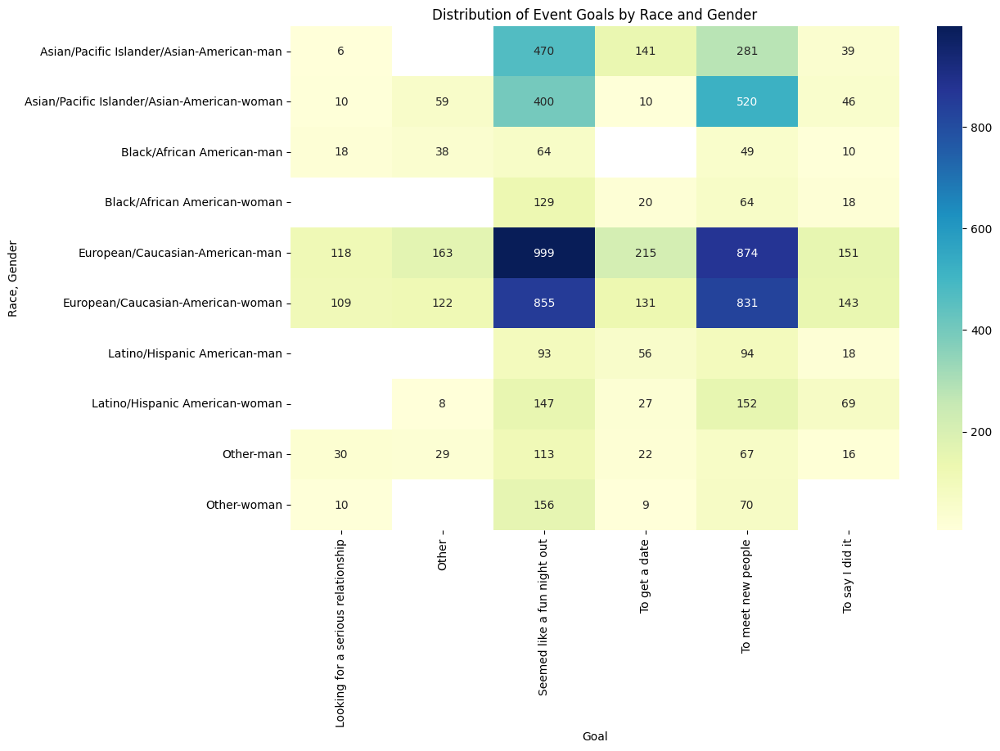

In [ ]:
# @title Distribution of Event Goals by Race and Gender

df_bi = df[['gender', 'race', 'career', 'goal']]
df_bi.loc[:, 'gender'] = df['gender'].replace({1: 'man', 0: 'woman'})
df_bi.loc[:, 'race'] = df['race'].replace({1: 'Black/African American', 2 : 'European/Caucasian-American', 3: 'Latino/Hispanic American', 4 : 'Asian/Pacific Islander/Asian-American', 5: 'Native American',6: 'Other',0: 'null'})
#df_bi.loc[:, 'date'] = df['date'].replace({1: 'Several times a week', 2: 'Twice a week', 3: 'Once a week', 4: 'Twice a month', 5: 'Once a month', 6: 'Several times a year',7: 'Almost never'})
df_bi.loc[:, 'goal'] = df['goal'].replace({1: 'Seemed like a fun night out', 2: 'To meet new people', 3: 'To get a date', 4: 'Looking for a serious relationship', 5: 'To say I did it', 6: 'Other',0: 'null'})
df_bi = df_bi.groupby(['gender', 'race', 'career', 'goal']).size().reset_index(name='count')
import matplotlib.pyplot as plt
import seaborn as sns

# Group the data by race, gender, and goal, and count the occurrences
df_grouped = df_bi.groupby(['race', 'gender', 'goal'])['count'].sum().unstack()

# Plot the heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(df_grouped, annot=True, cmap='YlGnBu', fmt='g')
plt.xlabel('Goal')
plt.ylabel('Race, Gender')
_ = plt.title('Distribution of Event Goals by Race and Gender')

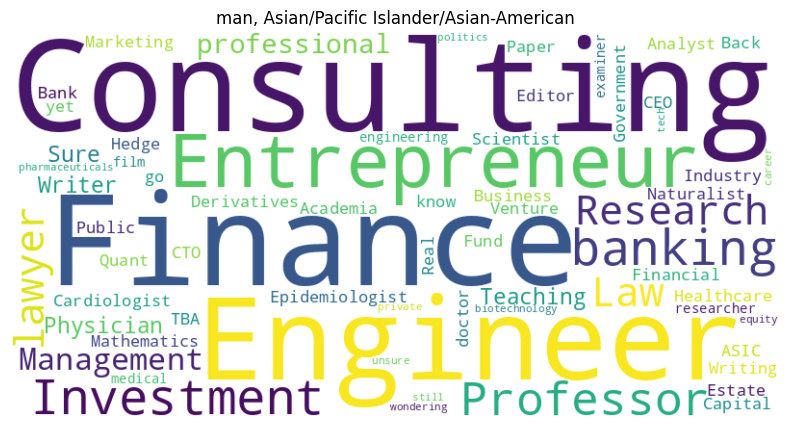

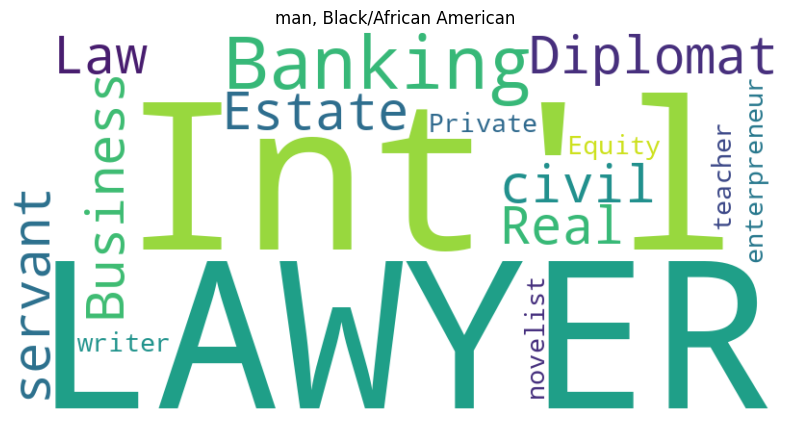

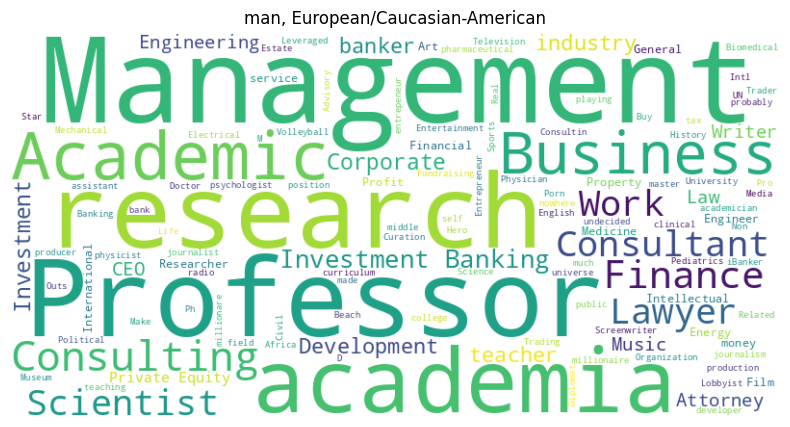

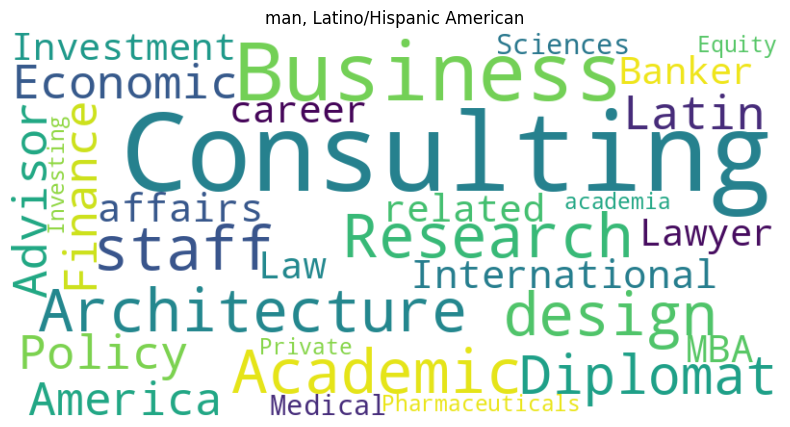

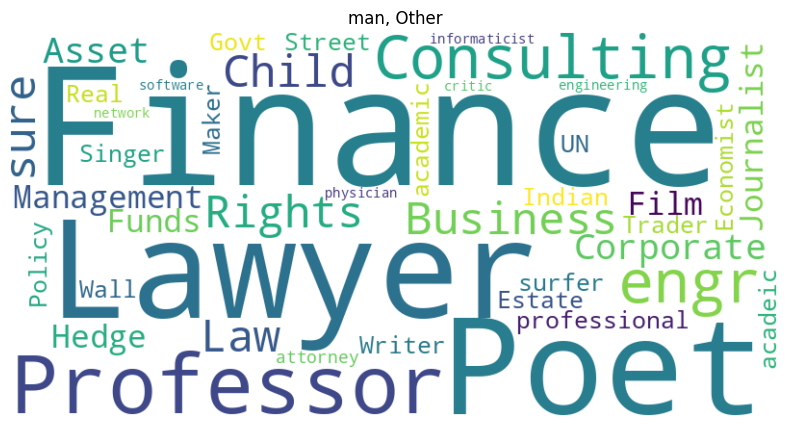

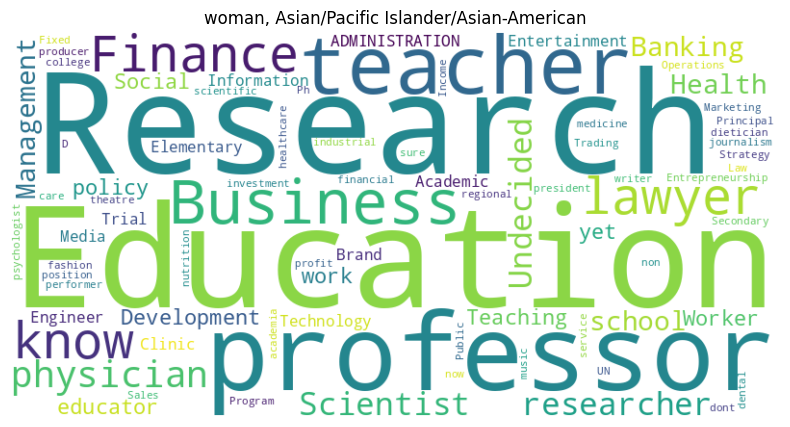

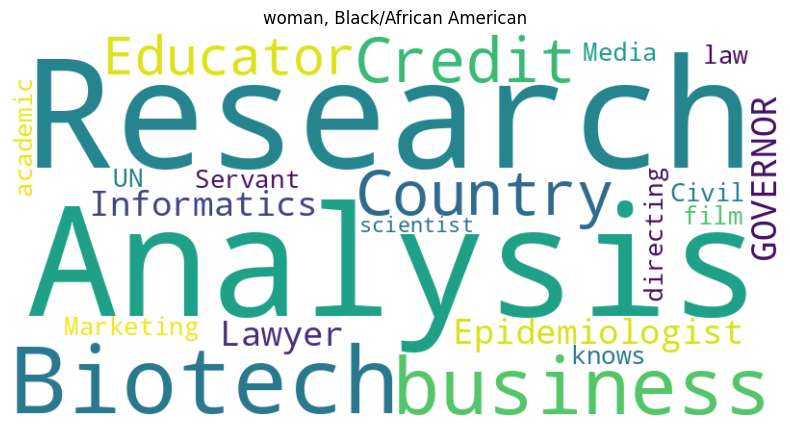

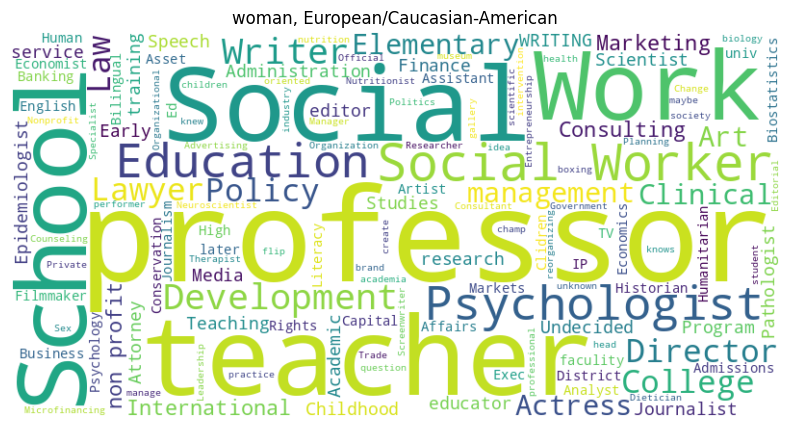

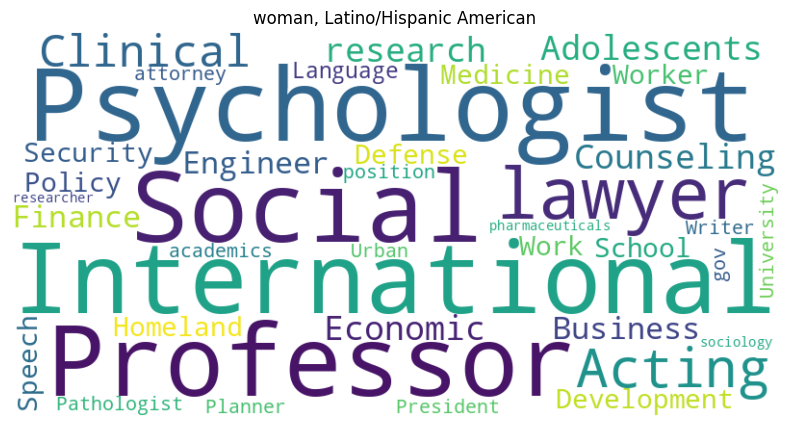

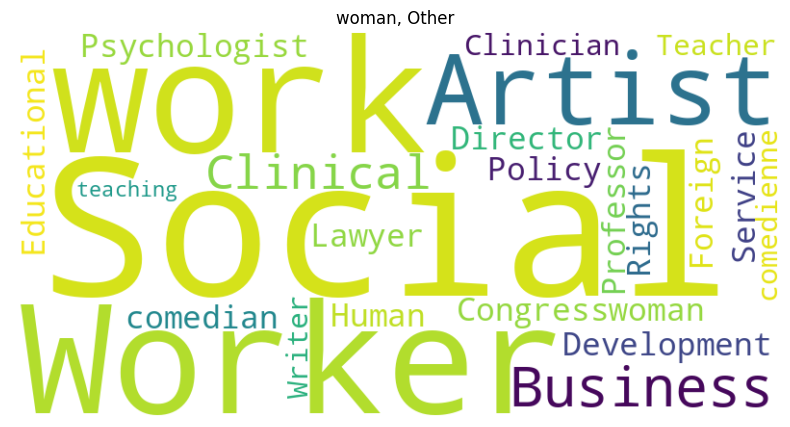

In [ ]:
# @title Career world cloud by Race and Gender
import pandas as pd
from wordcloud import WordCloud
import matplotlib.pyplot as plt


for gender in df_bi['gender'].unique():
    for race in df_bi['race'].unique():
        # Filter DataFrame for current gender and race
        subset = df_bi[(df_bi['gender'] == gender) & (df_bi['race'] == race)]

        # Join career strings for the subset
        careers = ' '.join(subset['career'].astype(str))

        # Generate word cloud for the subset
        wordcloud = WordCloud(width=800, height=400, background_color='white').generate(careers)

        # Display the word cloud
        plt.figure(figsize=(10, 5))
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f"{gender}, {race}") # Set title to gender and race
        plt.axis("off")
        plt.show()

## 3.0 Dating (analyze each question separately for each gender)

●	What’s important for you (what you look for in the opposite sex)

  ○	During Sign-up questionnaire

  ○	During Half-way
  
  ○	Compare between both

In [ ]:
# @title What are participants looking for in their matches - During Sign-up questionnaire
col_mapping ={'attr1_1': 'Attractive', 'sinc1_1': 'Sincere', 'intel1_1' : 'Intelligent', 'fun1_1' : 'Fun', 'amb1_1' : 'Ambitious', 'shar1_1' : 'Has shared interests/hobbies'}

def rename_cols(cols: list) -> list:
    _cols = list()
    for col in cols:
        if col in col_mapping.keys():
            _cols.append(col_mapping[col])
        else:
            _cols.append(col)
    return _cols

def col_normalize(x, col1, col2):
    x[col1] = (x[col1] / x[col2]) * 100
    return x

cols = ["iid", "pid", "dec", "gender", "attr1_1", "sinc1_1", "intel1_1", "fun1_1", "amb1_1", "shar1_1", "like", "prob"]
df_imprt = df.loc[:, cols]
#print("Columns with NaN values: {}".format(df_imprt.columns[df_imprt.isna().any()].tolist()))

# df_imprt[df_imprt.pid.isna()].head(3)
# Remove records those which has no pid
df_imprt.dropna(how='any', axis=0, subset=['pid'], inplace=True)

# Since in the instructions it clearly outlined that not attributes will be discussed during the couple's meetings, we cannot do a full NaN drop in the data.

attr_cols = cols[4:-2]
df_imprt.dropna(how='all', axis=0, subset=attr_cols, inplace=True)

_cols = [*attr_cols, attr_cols[0]]
_cols = rename_cols(_cols)

_women_attrs = df_imprt[df_imprt.gender == 0][attr_cols].mean(axis=0).to_list()
_men_attrs = df_imprt[df_imprt.gender == 1][attr_cols].mean(axis=0).to_list()

_women_attrs = [*_women_attrs, _women_attrs[0]]
_men_attrs = [*_men_attrs, _men_attrs[0]]
import plotly.graph_objs as go
fig = go.Figure(
    data=[
        go.Scatterpolar(r=_men_attrs, theta=_cols, fill='toself', name='Male', fillcolor='rgba(255, 110, 180, 0.5)', opacity=0.4),
        go.Scatterpolar(r=_women_attrs, theta=_cols, fill='toself', name='Female', fillcolor='rgba(142, 229, 238, 0.5)', opacity=0.5),
    ],
    layout=go.Layout(
        title=go.layout.Title(text='What are participants looking for in their matches - During Sign-up questionnaire'),
        polar={'radialaxis': {'visible': False} , "bgcolor": "lavenderblush", "gridshape": "linear" },
        showlegend=True
    )
)

fig.show()

For male participants, the attractiveness of the female is given a lot more weight, and the ambitiousness or if they have any shared interset are ranked not as high
For females, the points are more evenly distributed across all of the attributes, with fun and intelligence ranked slightly higher compared to others.

In [ ]:
# @title What are participants looking for in their matches - During Half-way
col_mapping = {'attr1_s': 'Attractive', 'sinc1_s': 'Sincere', 'intel1_s' : 'Intelligent', 'fun1_s' : 'Fun', 'amb1_s' : 'Ambitious', 'shar1_s' : 'Has shared interests/hobbies'}

def rename_cols(cols: list) -> list:
    _cols = list()
    for col in cols:
        if col in col_mapping.keys():
            _cols.append(col_mapping[col])
        else:
            _cols.append(col)
    return _cols

def col_normalize(x, col1, col2):
    x[col1] = (x[col1] / x[col2]) * 100
    return x

cols = ["iid", "pid", "dec", "gender", "attr1_s", "sinc1_s", "intel1_s", "fun1_s", "amb1_s", "shar1_s", "like", "prob"]
df_imprt = df.loc[:, cols]

df_imprt.dropna(how='any', axis=0, subset=['pid'], inplace=True)

attr_cols = cols[4:-2]
df_imprt.dropna(how='all', axis=0, subset=attr_cols, inplace=True)

_cols = [*attr_cols, attr_cols[0]]
_cols = rename_cols(_cols)

_women_attrs = df_imprt[df_imprt.gender == 0][attr_cols].mean(axis=0).to_list()
_men_attrs = df_imprt[df_imprt.gender == 1][attr_cols].mean(axis=0).to_list()

_women_attrs = [*_women_attrs, _women_attrs[0]]
_men_attrs = [*_men_attrs, _men_attrs[0]]
import plotly.graph_objs as go
fig = go.Figure(
    data=[
        go.Scatterpolar(r=_men_attrs, theta=_cols, fill='toself', name='Male', fillcolor='rgba(255, 110, 180, 0.5)', opacity=0.4),
        go.Scatterpolar(r=_women_attrs, theta=_cols, fill='toself', name='Female', fillcolor='rgba(142, 229, 238, 0.5)', opacity=0.5),
    ],
    layout=go.Layout(
        title=go.layout.Title(text='What are participants looking for in their matches - Half-way ?'),
        polar={'radialaxis': {'visible': False} , "bgcolor": "lavenderblush", "gridshape": "linear" },
        showlegend=True
    )
)

fig.show()

In [ ]:
# @title comparing between sign up and half way (spider plot)
# Define the columns for the sign-up and halfway surveys
signup_cols = ["iid", "pid", "dec", "gender", "attr1_1", "sinc1_1", "intel1_1", "fun1_1", "amb1_1", "shar1_1", "like", "prob"]
halfway_cols = ["iid", "pid", "dec", "gender", "attr1_s", "sinc1_s", "intel1_s", "fun1_s", "amb1_s", "shar1_s", "like", "prob"]
halfway_cols

# Extract and clean the data for sign-up
df_signup = df.loc[:, signup_cols]

df_signup.dropna(how='any', axis=0, subset=['pid'], inplace=True)
df_signup.dropna(how='all', axis=0, subset=signup_cols[4:-2], inplace=True)

# Extract and clean the data for halfway
df_halfway = df.loc[:, halfway_cols]
df_halfway.dropna(how='any', axis=0, subset=['pid'], inplace=True)
df_halfway.dropna(how='all', axis=0, subset=halfway_cols[4:-2], inplace=True)

# Define a function to rename columns for clarity
def rename_columns(df, prefix):
    col_mapping = {
        f"{prefix}attr1_1": "Attractive", f"{prefix}sinc1_1": "Sincere", f"{prefix}intel1_1": "Intelligent",
        f"{prefix}fun1_1": "Fun", f"{prefix}amb1_1": "Ambitious", f"{prefix}shar1_1": "Shared Interest",
        f"{prefix}attr1_s": "Attractive", f"{prefix}sinc1_s": "Sincere", f"{prefix}intel1_s": "Intelligent",
        f"{prefix}fun1_s": "Fun", f"{prefix}amb1_s": "Ambitious", f"{prefix}shar1_s": "Shared Interest"
    }
    return df.rename(columns=col_mapping)

# Rename columns for clarity
df_signup = rename_columns(df_signup, "")
df_halfway = rename_columns(df_halfway, "")

# Calculate mean attributes by gender for sign-up and halfway
signup_means = df_signup.groupby("gender")[["Attractive", "Sincere", "Intelligent", "Fun", "Ambitious", "Shared Interest"]].mean()
halfway_means = df_halfway.groupby("gender")[["Attractive", "Sincere", "Intelligent", "Fun", "Ambitious", "Shared Interest"]].mean()

# Add a 'Attractive' column for the polar plot
signup_means["Attractive"] = signup_means["Attractive"]
halfway_means["Attractive"] = halfway_means["Attractive"]

# Define a function to create the radar plot
def create_radar_plot(signup_data, halfway_data, title):
    categories = ["Attractive", "Sincere", "Intelligent", "Fun", "Ambitious", "Shared Interest", "Attractive"]

    fig = go.Figure()

    # Add traces for sign-up data
    fig.add_trace(go.Scatterpolar(
        r=signup_data.loc[0].tolist() + [signup_data.loc[0, "Attractive"]],
        theta=categories,
        fill='toself',
        name='Female Sign-Up',
        fillcolor='rgba(142, 229, 238, 0.5)',
        opacity=0.5
    ))
     # Add traces for halfway data
    fig.add_trace(go.Scatterpolar(
        r=halfway_data.loc[0].tolist() + [halfway_data.loc[0, "Attractive"]],
        theta=categories,
        fill='toself',
        name='Female Halfway',
        fillcolor='rgba(0, 128, 128, 0.5)',
        opacity=0.5
    ))
 # Update layout
    fig.update_layout(
        title=title,
        polar=dict(
            radialaxis=dict(visible=True),
            bgcolor="lavenderblush",
            gridshape="linear"
        ),
        showlegend=True
    )

    fig.show()

    fig = go.Figure()

    fig.add_trace(go.Scatterpolar(
        r=signup_data.loc[1].tolist() + [signup_data.loc[1, "Attractive"]],
        theta=categories,
        fill='toself',
        name='Male Sign-Up',
        fillcolor='rgba(255, 110, 180, 0.5)',
        opacity=0.4
    ))
    fig.add_trace(go.Scatterpolar(
        r=halfway_data.loc[1].tolist() + [halfway_data.loc[1, "Attractive"]],
        theta=categories,
        fill='toself',
        name='Male Halfway',
        fillcolor='rgba(128, 0, 128, 0.5)',
        opacity=0.4
    ))

    # Update layout
    fig.update_layout(
        title=title,
        polar=dict(
            radialaxis=dict(visible=True),
            bgcolor="lavenderblush",
            gridshape="linear"
        ),
        showlegend=True
    )

    fig.show()

# Create the radar plot
create_radar_plot(signup_means, halfway_means, 'Comparison of What Participants Look for in Matches (Sign-Up vs Halfway)')


In [ ]:
# @title	What’s important for others of the same gender? (what you think MOST of your fellow men/women look for in the opposite sex)
col_mapping ={'attr4_1': 'Attractive', 'sinc4_1': 'Sincere', 'intel4_1' : 'Intelligent', 'fun4_1' : 'Fun', 'amb4_1' : 'Ambitious', 'shar4_1' : 'Has shared interests/hobbies'}

def rename_cols(cols: list) -> list:
    _cols = list()
    for col in cols:
        if col in col_mapping.keys():
            _cols.append(col_mapping[col])
        else:
            _cols.append(col)
    return _cols

cols = ["iid", "gender", "attr4_1", "sinc4_1", "intel4_1", "fun4_1", "amb4_1", "shar4_1"]
_df =  df.loc[:, cols]
# Sum of columns: 'attr4_1', 'sinc4_1', 'intel4_1', 'fun4_1', 'amb4_1' & 'shar4_1' should be 100. But as seen from the data, there are wrong and missing entries.
# As a work around, let's scale them by 0-100

attr_cols = cols[2:]
_df.dropna(how='all', axis=0, subset=attr_cols, inplace=True) # Drop all those rows which has 0 sum (missing data)

# For incorrect data

_df['attr_sum'] = _df[attr_cols].sum(axis=1) # Calculate the sum

# If you have sum greater than 100, it means your data was incorrect. Normalize it to 0 - 100 range

# def col_normalize(x, col1, col2):
#     x[col1] = (x[col1] / x[col2]) * 100
#     return x

for attr in attr_cols:
    _df = _df.apply(lambda x: x if x['attr_sum'] <= float(100) else col_normalize(x, attr, 'attr_sum'), axis=1)

_df.drop(['attr_sum'], axis=1, inplace=True) # remove sum column

_cols = [*attr_cols, attr_cols[0]]
_cols = rename_cols(_cols)

_women_attrs = _df[_df.gender == 0][attr_cols].mean(axis=0).to_list()
_men_attrs = _df[_df.gender == 1][attr_cols].mean(axis=0).to_list()

_women_attrs = [*_women_attrs, _women_attrs[0]]
_men_attrs = [*_men_attrs, _men_attrs[0]]

fig = go.Figure(
    data=[
        go.Scatterpolar(r=_men_attrs, theta=_cols, fill='toself', name='Male', fillcolor='rgba(255, 110, 180, 0.5)', opacity=0.4),
        go.Scatterpolar(r=_women_attrs, theta=_cols, fill='toself', name='Female', fillcolor='rgba(142, 229, 238, 0.5)', opacity=0.5),
    ],
    layout=go.Layout(
        title=go.layout.Title(text='What paricipants think their same-sex peers are looking for ?'),
        polar={'radialaxis': {'visible': False} , "bgcolor": "lavenderblush", "gridshape": "linear" },
        showlegend=True
    )
)

fig.show()

Similar to the previous analysis, men think their fellow mates highly value attractiveness.
In contrast, there exist a significant difference in women’s answers in comparison to the presvious analysis. Women say that they themselves are looking for a well rounded man and attractiveness is not necessarily important. However, they think that other women are mainly looking for attractive and ambitious men.

In [ ]:
# @title What’s important for others of the opposite gender? (what do you think the opposite sex looks for in a date)

col_mapping ={'attr2_1': 'Attractive', 'sinc2_1': 'Sincere', 'intel2_1' : 'Intelligent', 'fun2_1' : 'Fun', 'amb2_1' : 'Ambitious', 'shar2_1' : 'Has shared interests/hobbies'}

def rename_cols(cols: list) -> list:
    _cols = list()
    for col in cols:
        if col in col_mapping.keys():
            _cols.append(col_mapping[col])
        else:
            _cols.append(col)
    return _cols

cols = ["iid", "gender", "attr2_1", "sinc2_1", "intel2_1", "fun2_1", "amb2_1", "shar2_1"]
_df =  df.loc[:, cols]

# Sum of columns: 'attr2_1', 'sinc2_1', 'intel2_1', 'fun2_1', 'amb2_1' & 'shar2_1' should be 100. But as seen from the data, there are wrong and missing entries.
# As a work around, let's scale them by 0-100

attr_cols = cols[2:]
_df.dropna(how='all', axis=0, subset=attr_cols, inplace=True) # Drop all those rows which has 0 sum (missing data)

# For incorrect data
_df['attr_sum'] = _df[attr_cols].sum(axis=1) # Calculate the sum

# If you have sum greater than 100, it means your data was incorrect. Normalize it to 0 - 100 range

# def col_normalize(x, col1, col2):
#     x[col1] = (x[col1] / x[col2]) * 100
#     return x

for attr in attr_cols:
    _df = _df.apply(lambda x: x if x['attr_sum'] <= float(100) else col_normalize(x, attr, 'attr_sum'), axis=1)

_df.drop(['attr_sum'], axis=1, inplace=True) # remove sum column

_cols = [*attr_cols, attr_cols[0]]
_cols = rename_cols(_cols)

_women_attrs = _df[_df.gender == 0][attr_cols].mean(axis=0).to_list()
_men_attrs = _df[_df.gender == 1][attr_cols].mean(axis=0).to_list()

_women_attrs = [*_women_attrs, _women_attrs[0]]
_men_attrs = [*_men_attrs, _men_attrs[0]]

fig = go.Figure(
    data=[
        go.Scatterpolar(r=_men_attrs, theta=_cols, fill='toself', name='Male', fillcolor='rgba(255, 110, 180, 0.5)', opacity=0.4),
        go.Scatterpolar(r=_women_attrs, theta=_cols, fill='toself', name='Female', fillcolor='rgba(142, 229, 238, 0.5)', opacity=0.5),
    ],
    layout=go.Layout(
        title=go.layout.Title(text='What do participants think the opposite sex is looking for ?'),
        polar={'radialaxis': {'visible': False} , "bgcolor": "lavenderblush", "gridshape": "linear" },
        showlegend=True
    )
)

fig.show()

Women strongly feel that men are most concerned with a woman’s attractiveness and that other attributes are not as important, especially ambitiousness.
Comapring female and male answers in the first graph, we can see that there are not that much difference between the two. We can say that women almost accurately predicted what men are looking for in their partners (i.e. attractiveness).
Additionally, men’s predictions were not far off either. By comparing males’ responses here and female’s responses in the first graph, what men think women are looking for also closely resembles what women say they are looking for. The main differences, though, are a higher attractiveness score and a lower shared interest score

## 4.0	Me vs. others (bar/histogram)

In [ ]:
# @title 	How do I perceive myself? (how do you think you measure up?)

# Define columns for self-perception at different times
self_attributes_time1 = ["attr3_1", "sinc3_1", "intel3_1", "fun3_1", "amb3_1"]
self_attributes_time2 = ["attr3_2", "sinc3_2", "intel3_2", "fun3_2", "amb3_2"]
self_attributes_time3 = ["attr3_3", "sinc3_3", "intel3_3", "fun3_3", "amb3_3"]

# Check for missing columns and create them if they don't exist
for col in self_attributes_time1 + self_attributes_time2 + self_attributes_time3:
    if col not in df.columns:
        print(f"Missing column: {col}")
        df[col] = pd.NA  # Fill missing columns with NA

# Calculate average self-perception for each time period using .loc to avoid SettingWithCopyWarning
df.loc[:, "self_perception_time1"] = df.loc[:, self_attributes_time1].mean(axis=1)
df.loc[:, "self_perception_time2"] = df.loc[:, self_attributes_time2].mean(axis=1)
df.loc[:, "self_perception_time3"] = df.loc[:, self_attributes_time3].mean(axis=1)

# Overall self-perception
df.loc[:, "overall_self_perception"] = df.loc[:, ["self_perception_time1", "self_perception_time2", "self_perception_time3"]].mean(axis=1)

In [ ]:
# @title How do I think others perceive me? (how do you think others perceive you?)

# Define columns for perceived perception by others at different times
guess_attributes_time1 = ["attr5_1", "sinc5_1", "intel5_1", "fun5_1", "amb5_1"]
guess_attributes_time2 = ["attr5_2", "sinc5_2", "intel5_2", "fun5_2", "amb5_2"]
guess_attributes_time3 = ["attr5_3", "sinc5_3", "intel5_3", "fun5_3", "amb5_3"]

# Check for missing columns and create them if they don't exist
for col in guess_attributes_time1 + guess_attributes_time2 + guess_attributes_time3:
    if col not in df.columns:
        print(f"Missing column: {col}")
        df[col] = pd.NA  # Fill missing columns with NA

# Calculate average perceived perception for each time period using .loc to avoid SettingWithCopyWarning
df.loc[:, "guess_perception_time1"] = df.loc[:, guess_attributes_time1].mean(axis=1)
df.loc[:, "guess_perception_time2"] = df.loc[:, guess_attributes_time2].mean(axis=1)
df.loc[:, "guess_perception_time3"] = df.loc[:, guess_attributes_time3].mean(axis=1)

# Overall perceived perception
df.loc[:, "overall_guess_perception"] = df.loc[:, ["guess_perception_time1", "guess_perception_time2", "guess_perception_time3"]].mean(axis=1)


In [ ]:
# @title How do others actually perceive me?

# Actual perception columns
partner_attributes = ["attr_o", "sinc_o", "intel_o", "fun_o", "amb_o"]

# Check for missing columns and create them if they don't exist
for col in partner_attributes:
    if col not in df.columns:
        print(f"Missing column: {col}")
        df[col] = pd.NA  # Fill missing columns with NA

# Calculate average actual perception using .loc to avoid SettingWithCopyWarning
df.loc[:, "actual_perception"] = df.loc[:, partner_attributes].mean(axis=1)


In [ ]:
# @title Perception by gender
gender_groups = df.groupby("gender")

# Mean values for self-perception, guess perception, and actual perception
self_perception_by_gender = gender_groups["overall_self_perception"].mean()
guess_perception_by_gender = gender_groups["overall_guess_perception"].mean()
actual_perception_by_gender = gender_groups["actual_perception"].mean()

# Presenting the values and agreement scores
print("Self Perception by Gender")
print(self_perception_by_gender)

print("\nGuess Perception by Gender")
print(guess_perception_by_gender)

print("\nActual Perception by Gender")
print(actual_perception_by_gender)

Self Perception by Gender
gender
0    7.853744
1    7.659730
Name: overall_self_perception, dtype: float64

Guess Perception by Gender
gender
0    7.523152
1    7.435657
Name: overall_guess_perception, dtype: float64

Actual Perception by Gender
gender
0    6.831425
1    6.734885
Name: actual_perception, dtype: float64


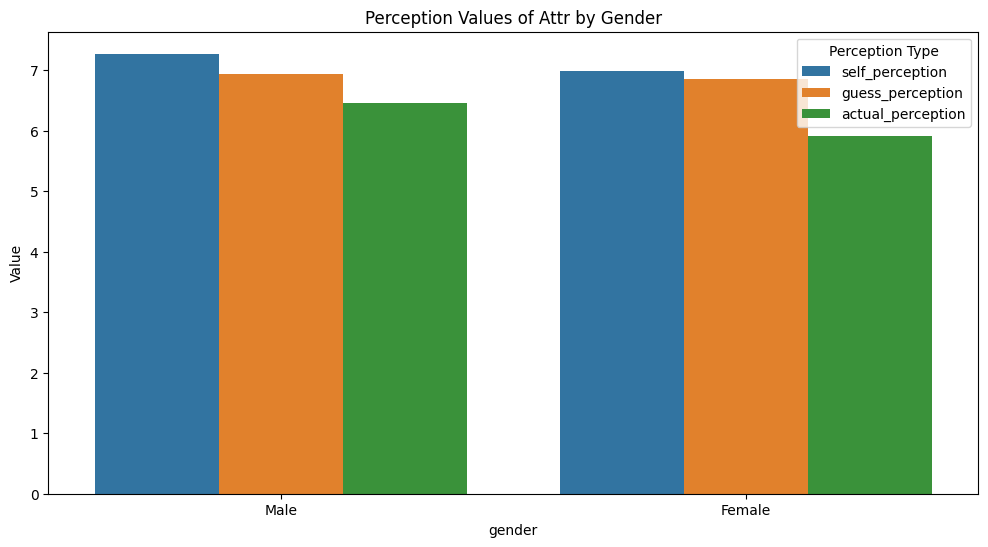

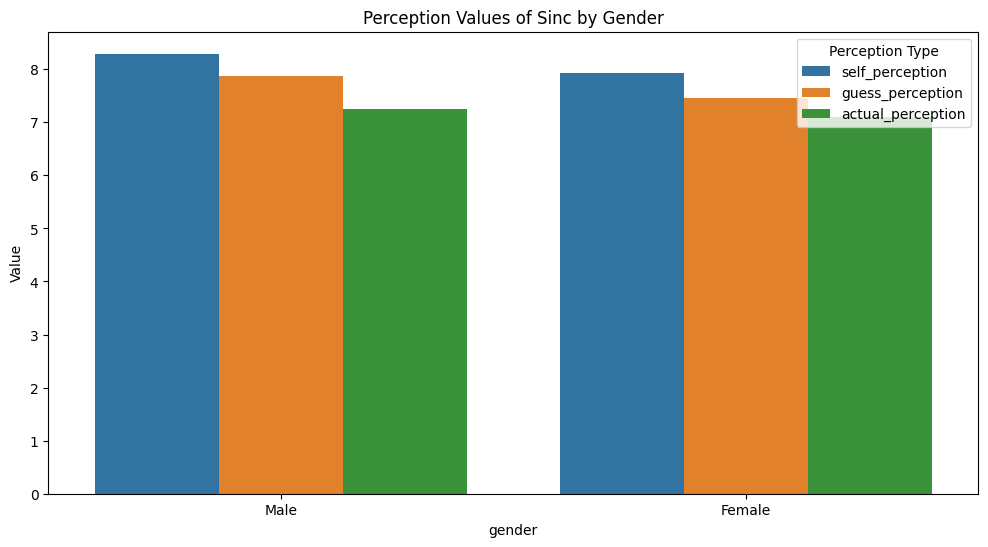

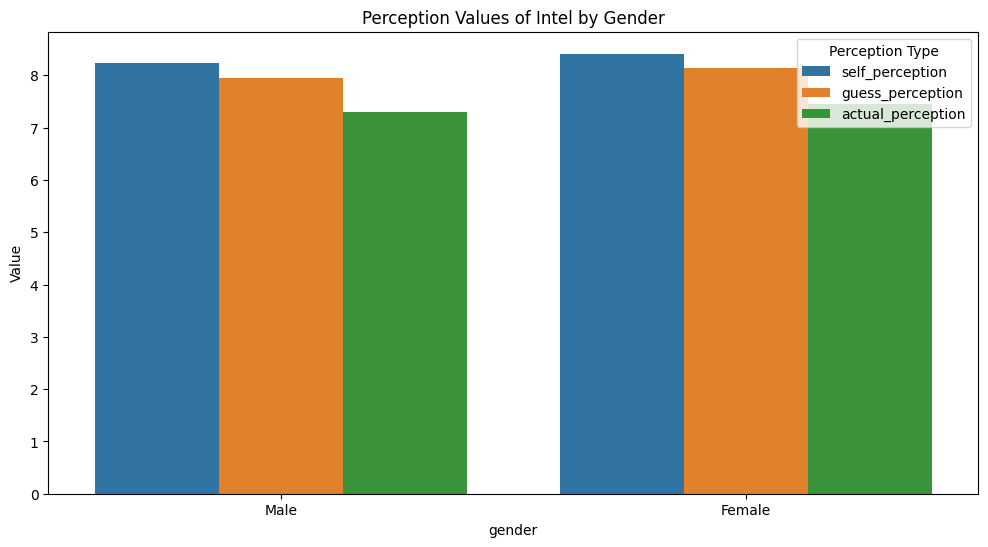

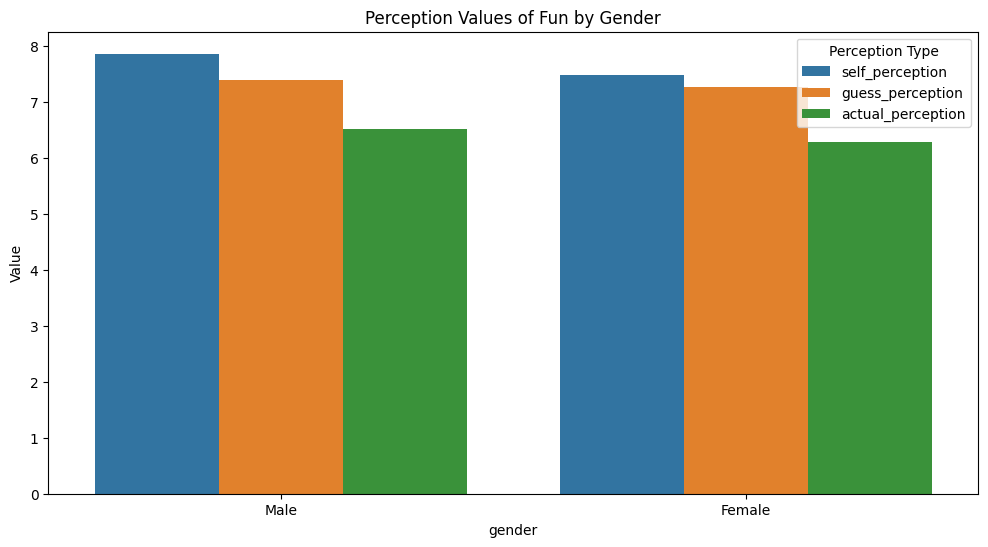

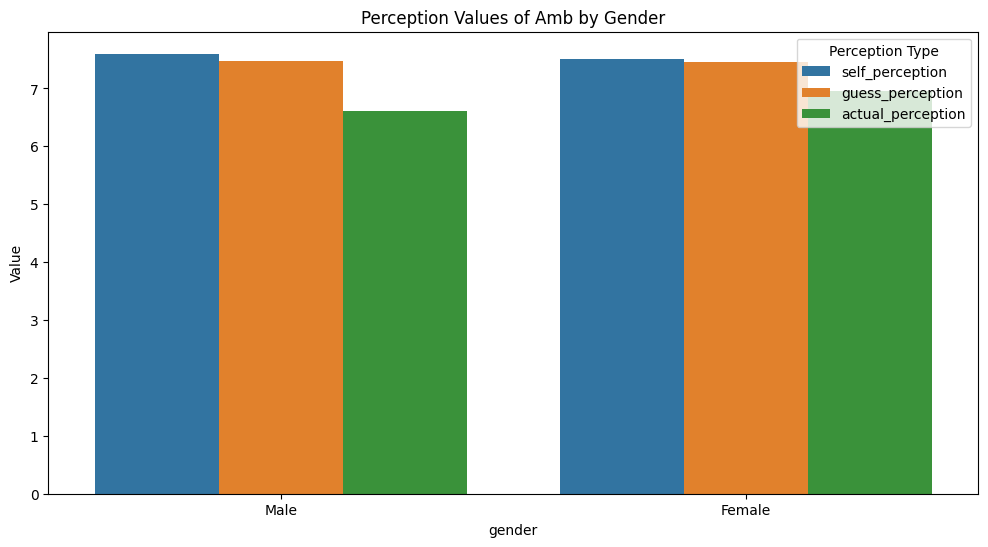


Feature: attr
Self Perception by Gender
gender
0    7.273168
1    6.982878
Name: self_attr_perception, dtype: float64
Guess Perception by Gender
gender
0    6.942656
1    6.848804
Name: guess_attr_perception, dtype: float64
Actual Perception by Gender
gender
0    6.461401
1    5.919422
Name: attr_o, dtype: float64

Feature: sinc
Self Perception by Gender
gender
0    8.292088
1    7.926684
Name: self_sinc_perception, dtype: float64
Guess Perception by Gender
gender
0    7.863380
1    7.459262
Name: guess_sinc_perception, dtype: float64
Actual Perception by Gender
gender
0    7.251053
1    7.099778
Name: sinc_o, dtype: float64

Feature: intel
Self Perception by Gender
gender
0    8.242384
1    8.413234
Name: self_intel_perception, dtype: float64
Guess Perception by Gender
gender
0    7.957612
1    8.141535
Name: guess_intel_perception, dtype: float64
Actual Perception by Gender
gender
0    7.291202
1    7.447362
Name: intel_o, dtype: float64

Feature: fun
Self Perception by Gender
gende

In [ ]:
# @title Detailed Aggregation per Feature
features = ["attr", "sinc", "intel", "fun", "amb"]
feature_agreement = {}

for feature in features:
    self_feature_time1 = f"{feature}3_1"
    self_feature_time2 = f"{feature}3_2"
    self_feature_time3 = f"{feature}3_3"
    guess_feature_time1 = f"{feature}5_1"
    guess_feature_time2 = f"{feature}5_2"
    guess_feature_time3 = f"{feature}5_3"
    actual_feature = f"{feature}_o"

    if all(f in df.columns for f in [self_feature_time1, self_feature_time2, self_feature_time3]):
        # Self-perception
        self_perception = df[[self_feature_time1, self_feature_time2, self_feature_time3]].mean(axis=1).rename(f"self_{feature}_perception")
        df[f"self_{feature}_perception"] = self_perception
        self_perception_by_gender = df.groupby("gender")[f"self_{feature}_perception"].mean()
    else:
        self_perception_by_gender = pd.Series()

    if all(f in df.columns for f in [guess_feature_time1, guess_feature_time2, guess_feature_time3]):
        # Guess-perception
        guess_perception = df[[guess_feature_time1, guess_feature_time2, guess_feature_time3]].mean(axis=1).rename(f"guess_{feature}_perception")
        df[f"guess_{feature}_perception"] = guess_perception
        guess_perception_by_gender = df.groupby("gender")[f"guess_{feature}_perception"].mean()
    else:
        guess_perception_by_gender = pd.Series()

    if actual_feature in df.columns:
        # Actual perception
        actual_perception_by_gender = df.groupby("gender")[actual_feature].mean()
    else:
        actual_perception_by_gender = pd.Series()

    feature_agreement[feature] = {
        "self_perception_by_gender": self_perception_by_gender,
        "guess_perception_by_gender": guess_perception_by_gender,
        "actual_perception_by_gender": actual_perception_by_gender,
    }

# Combine the data into a dictionary for easier manipulation
data = {}
for feature, values in feature_agreement.items():
    data[feature] = {
        "self_perception": values["self_perception_by_gender"].tolist(),
        "guess_perception": values["guess_perception_by_gender"].tolist(),
        "actual_perception": values["actual_perception_by_gender"].tolist()
    }

# Convert the dictionary into a DataFrame for easier manipulation
def create_df(feature, data):
    df = pd.DataFrame(data[feature])
    df['gender'] = ['Male', 'Female']
    return df

# Define a function to plot bar charts for perception values for each feature
def plot_perception_values(feature, data):
    df = create_df(feature, data)
    df_melt = df.melt(id_vars=['gender'], value_vars=['self_perception', 'guess_perception', 'actual_perception'],
                      var_name='Perception Type', value_name='Value')

    plt.figure(figsize=(12, 6))
    sns.barplot(x='gender', y='Value', hue='Perception Type', data=df_melt)
    plt.title(f"Perception Values of {feature.capitalize()} by Gender")
    plt.ylabel("Value")
    plt.show()

# Plotting for each feature
for feature in data.keys():
    plot_perception_values(feature, data)

# Presenting the detailed values and agreement scores per feature
for feature, data in feature_agreement.items():
    print(f"\nFeature: {feature}")
    print("Self Perception by Gender")
    print(data["self_perception_by_gender"])

    print("Guess Perception by Gender")
    print(data["guess_perception_by_gender"])

    print("Actual Perception by Gender")
    print(data["actual_perception_by_gender"])


In the analysis of self-perception, guess perception, and actual perception across various attributes (attractiveness, sincerity, fun, and ambition), it was consistently observed that self-perception scores were higher than guess perception scores.
Furthermore, actual perception scores were the lowest across all attributes. This trend indicates that individuals tend to rate themselves more favorably compared to how they believe others perceive them and the actual perception scores



## 5.0	Effects of experiment setup/surroundings (% match by:)

<ipython-input-25-310964873ac3>:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




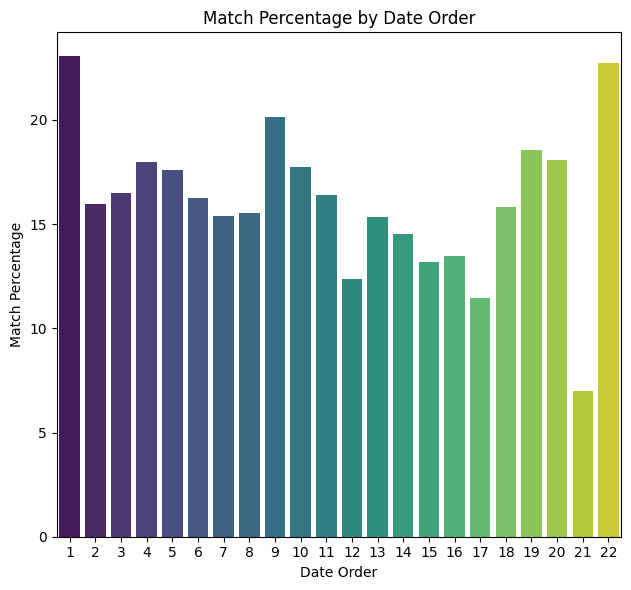

In [ ]:
# @title ●	Date order
# Calculate the match percentage by date order
date_order_match = df.groupby('order')['match'].mean() * 100

# Plotting the results
plt.figure(figsize=(18, 6))

# Date Order Match Percentage
plt.subplot(1, 3, 1)
sns.barplot(x=date_order_match.index, y=date_order_match.values, palette='viridis')
plt.title('Match Percentage by Date Order')
plt.xlabel('Date Order')
plt.ylabel('Match Percentage')

plt.tight_layout()
plt.show()

Date Order :
The highest percentage of matches is observed for dates with order numbers 1 and 22.

Possible Reasons:

*   Order 1: Participants may be more enthusiastic and less fatigued at the beginning of the dating event, leading to higher engagement and more positive interactions
*   Order 22: By the time participants reach order 22, they might have adjusted to the process, becoming more relaxed and comfortable, which can enhance their interactions.



<ipython-input-26-cd085d045548>:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




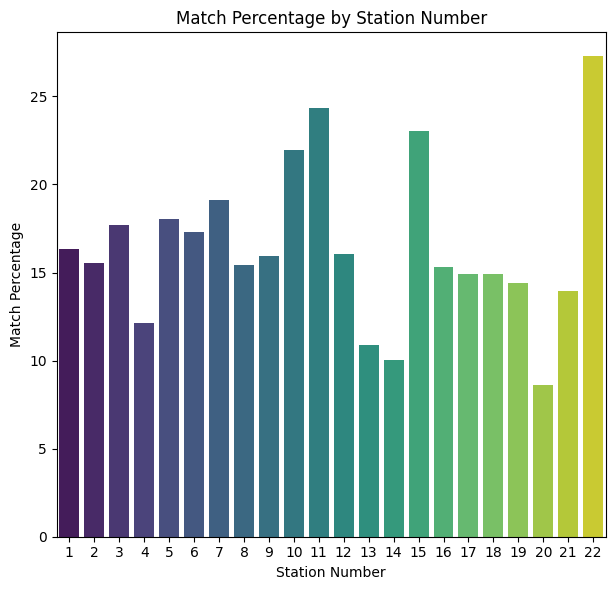

In [ ]:
# @title ●	Station number (is there any “lucky table”?)
# Calculate the match percentage by station number (position)
station_match = df.groupby('position')['match'].mean() * 100

# Plotting the results
plt.figure(figsize=(18, 6))

# Station Match Percentage
plt.subplot(1, 3, 2)
sns.barplot(x=station_match.index, y=station_match.values, palette='viridis')
plt.title('Match Percentage by Station Number')
plt.xlabel('Station Number')
plt.ylabel('Match Percentage')

plt.tight_layout()
plt.show()

Station Number
 22 has the highest percentage of matches.

Possible Reasons:
*   The physical environment at station 22 might be more conducive to positive interactions. For example, it could be quieter, more private, or simply more aesthetically pleasing, making participants feel more at ease and open.


<ipython-input-27-c56a98de3d40>:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




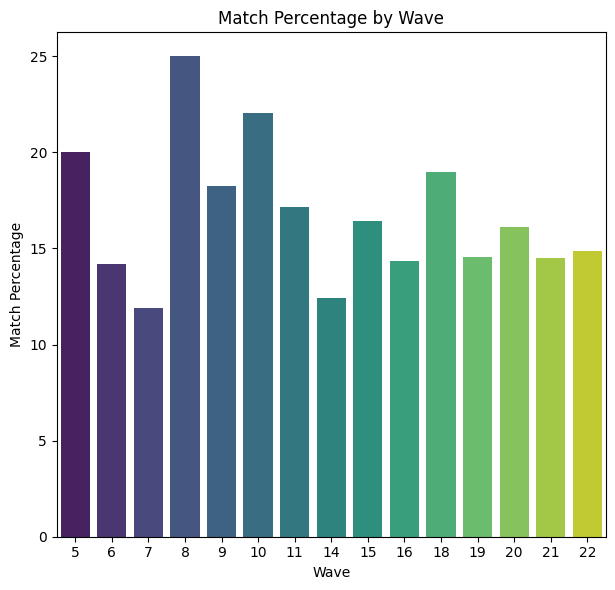

In [ ]:
# @title ●	Waves
# Calculate the match percentage by wave (round)
wave_match = df.groupby('round')['match'].mean() * 100

# Plotting the results
plt.figure(figsize=(18, 6))

# Wave Match Percentage
plt.subplot(1, 3, 3)
sns.barplot(x=wave_match.index, y=wave_match.values, palette='viridis')
plt.title('Match Percentage by Wave')
plt.xlabel('Wave')
plt.ylabel('Match Percentage')

plt.tight_layout()
plt.show()

# Data preprocessing



##Transform the preferences data for waves 6-9, because they used a 1-10 scale instead of a percentages scale
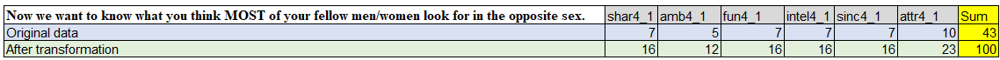


In [ ]:
# @title Scale function:
def update_columns_with_percentages(df, columns_to_update):
    row_sums = df[columns_to_update].sum(axis=1)
    df.loc[:,columns_to_update] = df.loc[:,columns_to_update].div(row_sums, axis=0) * 100

# Apply the function to subsets
df_wave6 = df[df['wave'].isin([6, 7, 8, 9])]

columns_to_update_sets = [
    ['shar4_1', 'amb4_1', 'fun4_1', 'intel4_1', 'sinc4_1', 'attr4_1'],
    ['attr3_1', 'sinc3_1', 'fun3_1', 'intel3_1', 'amb3_1'],
    ['attr1_2', 'sinc1_2', 'intel1_2', 'fun1_2', 'amb1_2', 'shar1_2']
]
for columns_to_update in columns_to_update_sets:
 update_columns_with_percentages(df_wave6, columns_to_update)

# Use .copy() to create a separate DataFrame to avoid potential issues with chained indexing
df_other_waves = df.loc[~df['wave'].isin([6, 7, 8, 9])].copy()
df_combined = pd.concat([df_other_waves, df_wave6])
df=df_combined.sort_values(by=['wave'])

In [ ]:
# @title Removing wave 12, because participants were only allowed to vote yes for up to 50% of their dates
df = df.loc[(df["wave"] != 12), :]

Wave 8 shows the highest match percentage among all the waves.
Possible Reasons:

*   The demographic of participants in wave 8 might have had better compatibility.
*   Organizational improvements or optimizations made by the event organizers by the time wave 8 occurred might have contributed to a more effective setup.

# Modeling

## What do people like in others? (predict decision based on other’s data)

In [ ]:
# @title DataFrame - other’s data
train_data = df[['wave', 'round', 'position', 'positin1', 'order','pid',
                 'int_corr', 'samerace', 'age_o', 'race_o', 'pf_o_att',
                 'pf_o_sin', 'pf_o_int', 'pf_o_fun', 'pf_o_amb', 'pf_o_sha',
                 'dec_o', 'attr_o', 'sinc_o', 'intel_o', 'fun_o', 'amb_o',
                 'shar_o', 'like_o', 'prob_o', 'met_o']]

In [ ]:
# @title Data Preprocessing
train_data.fillna(method='ffill', inplace=True)
if train_data.isnull().values.any():
    train_data.fillna(method='bfill', inplace=True)
label_encoders = {}
for column in train_data.select_dtypes(include=['object']).columns:
    label_encoders.loc[:,[column]] = LabelEncoder()
    train_data.loc[:, [column]] = label_encoders.loc[:, [column]].fit_transform(train_data.loc[:, [column]])

<ipython-input-43-43b42e380347>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data.fillna(method='ffill', inplace=True)
<ipython-input-43-43b42e380347>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data.fillna(method='bfill', inplace=True)


Wave 1: Accuracy = 0.675
Wave 2: Accuracy = 0.7680921052631579
Wave 3: Accuracy = 0.74
Wave 4: Accuracy = 0.8009259259259259
Wave 5: Accuracy = 0.8157894736842105
Wave 6: Accuracy = 0.82
Wave 7: Accuracy = 0.76171875
Wave 8: Accuracy = 0.73
Wave 9: Accuracy = 0.75625
Wave 10: Accuracy = 0.7654320987654321
Wave 11: Accuracy = 0.8049886621315193
Wave 12: Accuracy = 0.7831632653061225
Wave 13: Accuracy = 0.7277777777777777
Wave 14: Accuracy = 0.7527777777777778
Wave 15: Accuracy = 0.7192982456140351
Wave 16: Accuracy = 0.7916666666666666
Wave 17: Accuracy = 0.6714285714285714
Wave 18: Accuracy = 0.7361111111111112
Wave 19: Accuracy = 0.7422222222222222
Wave 20: Accuracy = 0.7380952380952381
Wave 21: Accuracy = 0.7644628099173554


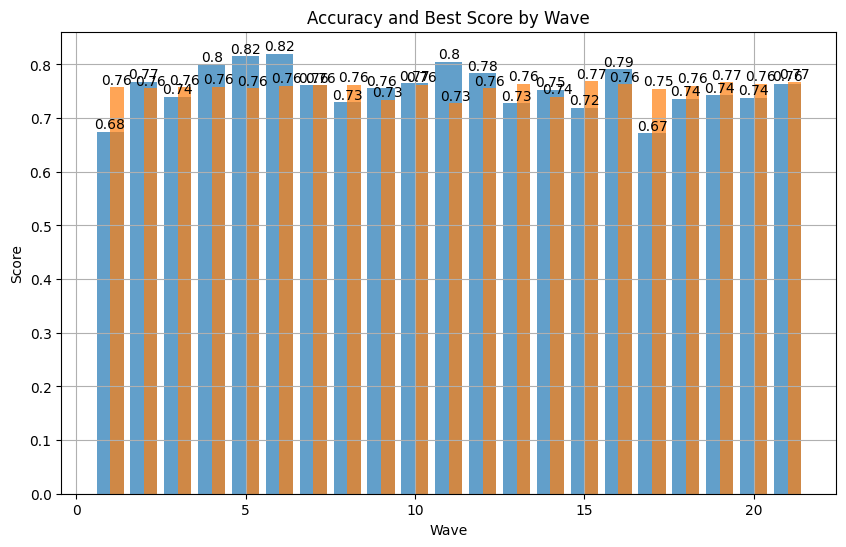

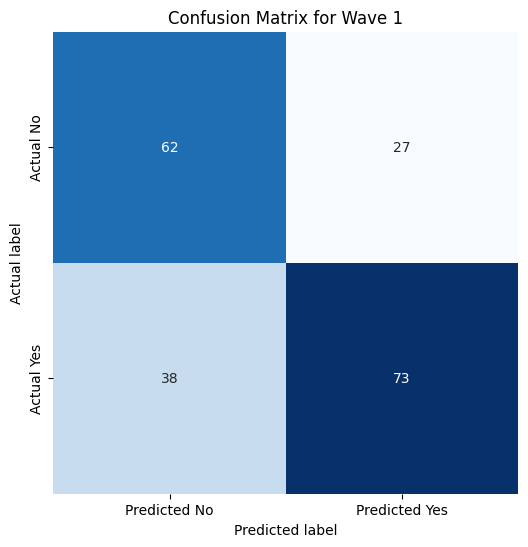

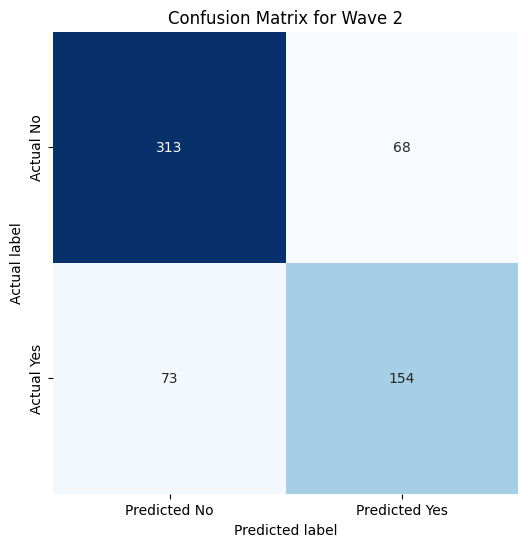

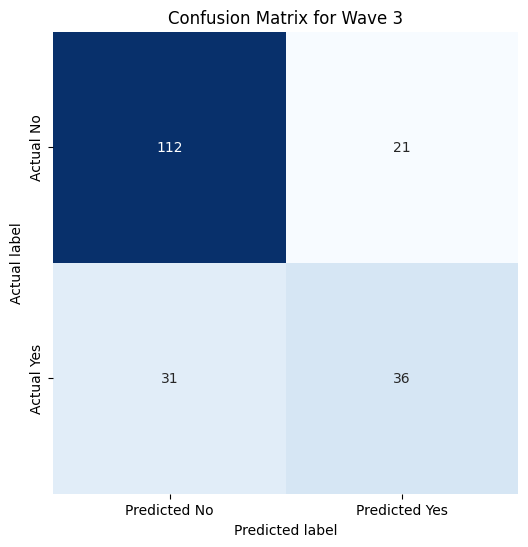

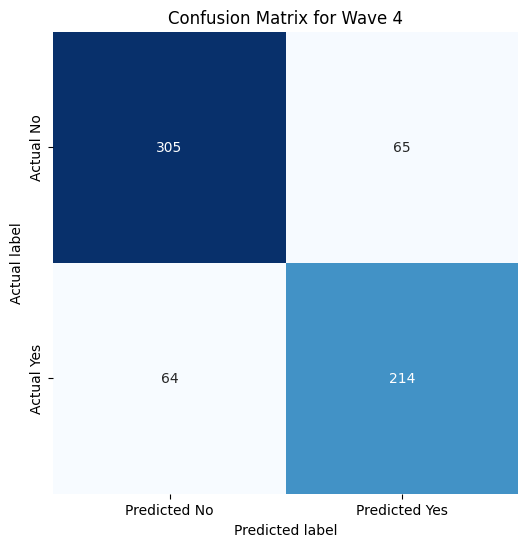

...

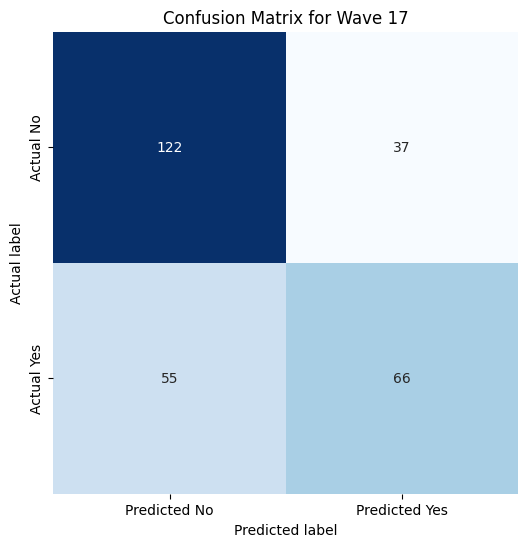

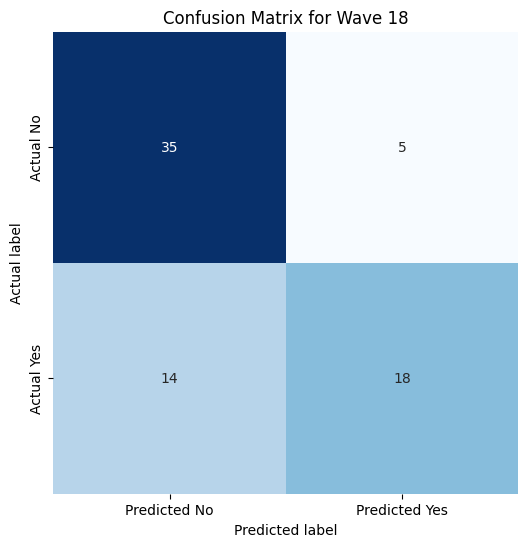

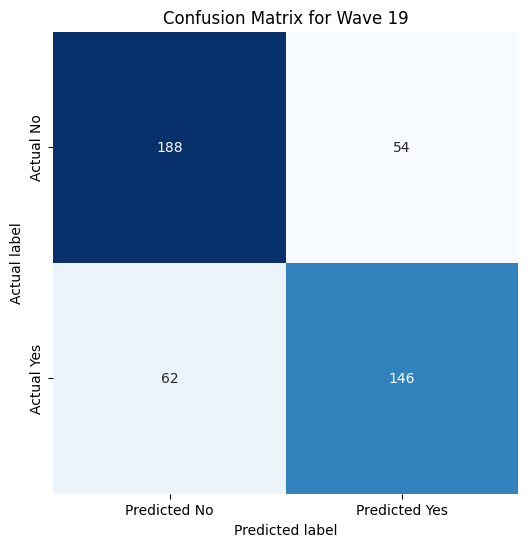

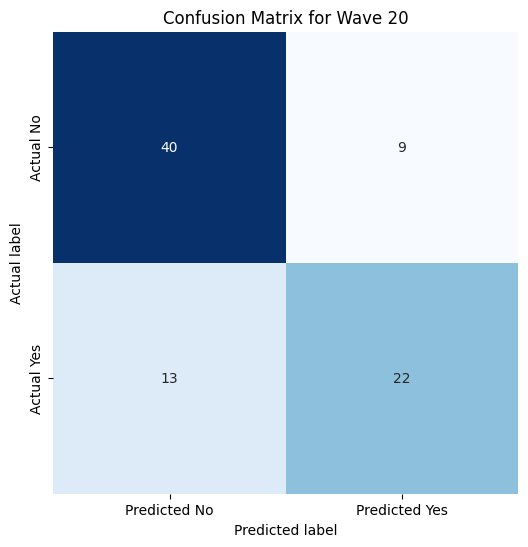

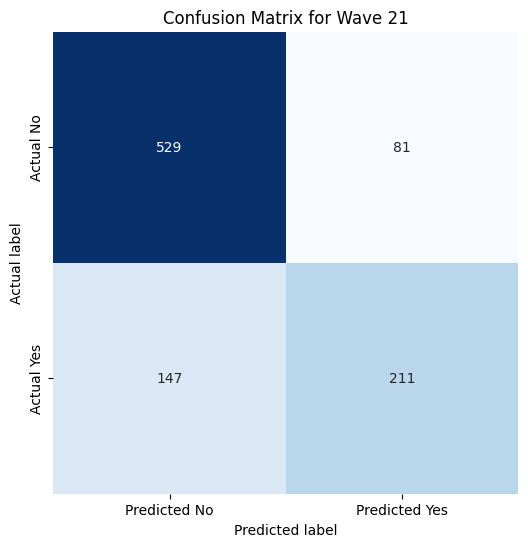

Classification Report for Wave 1:
              precision    recall  f1-score   support

           0       0.62      0.70      0.66        89
           1       0.73      0.66      0.69       111

    accuracy                           0.68       200
   macro avg       0.68      0.68      0.67       200
weighted avg       0.68      0.68      0.68       200


Classification Report for Wave 2:
              precision    recall  f1-score   support

           0       0.81      0.82      0.82       381
           1       0.69      0.68      0.69       227

    accuracy                           0.77       608
   macro avg       0.75      0.75      0.75       608
weighted avg       0.77      0.77      0.77       608


Classification Report for Wave 3:
              precision    recall  f1-score   support

           0       0.78      0.84      0.81       133
           1       0.63      0.54      0.58        67

    accuracy                           0.74       200
   macro avg       0.71 

In [ ]:
# @title Prediction by Wave and accuracy
wave_predictions = pd.DataFrame()
sum_predictions = []
classification_reports = []
confusion_matrices = []

for wave in train_data['wave'].unique():
  X_train = train_data[train_data['wave'] != wave].drop(['dec_o'], axis=1)
  y_train = train_data[train_data['wave'] != wave]['dec_o']
  X_val = train_data[train_data['wave'] == wave].drop(['dec_o'], axis=1)
  y_val = train_data[train_data['wave'] == wave]['dec_o']
  model = RandomForestClassifier(random_state=42)
#  model = xgb.XGBClassifier()
#  model = xgb.XGBRegressor()
  param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [3, 6, 9]  #for tesla
  }
  grid_search = GridSearchCV(estimator=model, param_grid=param_grid,cv=5,
                             scoring='accuracy', n_jobs=-1)
  grid_search.fit(X_train, y_train)
  y_pred = grid_search.best_estimator_.predict(X_val)
  accuracy = accuracy_score(y_val, y_pred)
  f1 = f1_score(y_val, y_pred)

  wave_results = {
      'wave': wave,
      'Best_Parameters': grid_search.best_params_,
      'best_score': grid_search.best_score_,
      'accuracy': accuracy,
      'f1': f1
  }
  print(f'Wave {wave}: Accuracy = {accuracy}')
  sum_predictions.append(wave_results)

  # Compute confusion matrix and classification report
  cm = sklearn.metrics.confusion_matrix(y_val, y_pred)  # Use the sklearn function
  cr = sklearn.metrics.classification_report(y_val, y_pred)  # Use the sklearn function
  confusion_matrices.append((wave, cm))
  classification_reports.append((wave, cr))

sum_predictions = pd.DataFrame(sum_predictions)

plt.figure(figsize=(10, 6))
bars1 = plt.bar(sum_predictions['wave'],
                sum_predictions['accuracy'],
                label='Accuracy', alpha=0.7)
bars2 = plt.bar(sum_predictions['wave'] + 0.2,
                sum_predictions['best_score'],
                label='Best Score',
                alpha=0.7, width=0.4)

plt.xlabel('Wave')
plt.ylabel('Score')
plt.title('Accuracy and Best Score by Wave')
plt.grid(True)

for bar in bars1 + bars2:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center')

plt.show()

# Plotting confusion matrices
for wave, cm in confusion_matrices:
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted No', 'Predicted Yes'],
                yticklabels=['Actual No', 'Actual Yes'])
    plt.title(f'Confusion Matrix for Wave {wave}')
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    plt.show()

# Printing classification reports
for wave, cr in classification_reports:
    print(f'Classification Report for Wave {wave}:\n{cr}\n')

## What do people like in me? (prediction other’s decision based on my data)

In [ ]:
# @title DataFrame - my data
train_data = df[['iid', 'dec_o', 'match', 'int_corr', 'samerace', 'age',
                 'field_cd', 'race', 'imprace', 'imprelig', 'income', 'goal',
                 'date', 'go_out', 'career', 'career_c', 'sports', 'tvsports',
                 'exercise', 'dining', 'museums', 'art', 'hiking', 'gender',
                 'wave', 'round', 'position', 'positin1', 'order', 'gaming',
                 'clubbing', 'reading', 'tv']]

In [ ]:
# @title Data Preprocessing
train_data.fillna(method='ffill', inplace=True)
if train_data.isnull().values.any():
    train_data.fillna(method='bfill', inplace=True)
label_encoders = {}
for column in train_data.select_dtypes(include=['object']).columns:
    label_encoders[column] = LabelEncoder()
    train_data[column] = label_encoders[column].fit_transform(train_data[column])

<ipython-input-9-34abc90289b6>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data.fillna(method='ffill', inplace=True)
<ipython-input-9-34abc90289b6>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data.fillna(method='bfill', inplace=True)
<ipython-input-9-34abc90289b6>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train_data[column] = label_encoders[column].fi

Wave 1: Accuracy = 0.725
Wave 2: Accuracy = 0.7286184210526315
Wave 3: Accuracy = 0.795
Wave 4: Accuracy = 0.7608024691358025
Wave 5: Accuracy = 0.8
Wave 6: Accuracy = 0.7
Wave 7: Accuracy = 0.73828125
Wave 8: Accuracy = 0.75
Wave 9: Accuracy = 0.72375
Wave 10: Accuracy = 0.6975308641975309
Wave 11: Accuracy = 0.7403628117913832
Wave 13: Accuracy = 0.7
Wave 14: Accuracy = 0.7527777777777778
Wave 15: Accuracy = 0.7324561403508771
Wave 16: Accuracy = 0.7916666666666666
Wave 17: Accuracy = 0.7357142857142858
Wave 18: Accuracy = 0.6388888888888888
Wave 19: Accuracy = 0.7022222222222222
Wave 20: Accuracy = 0.7023809523809523
Wave 21: Accuracy = 0.7747933884297521


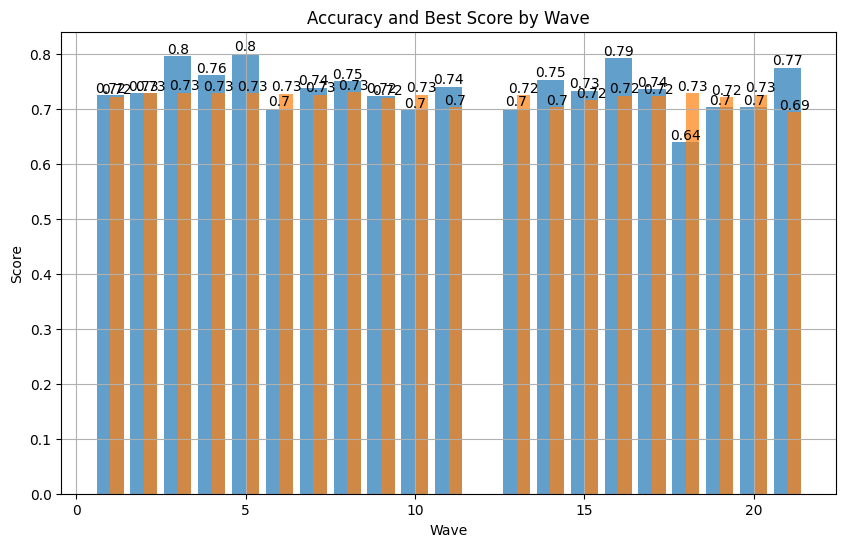

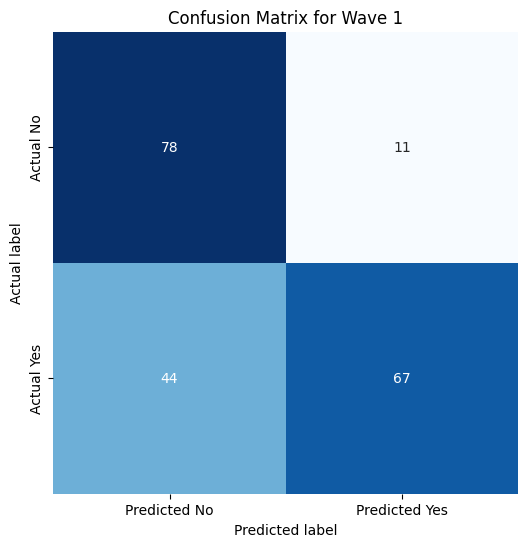

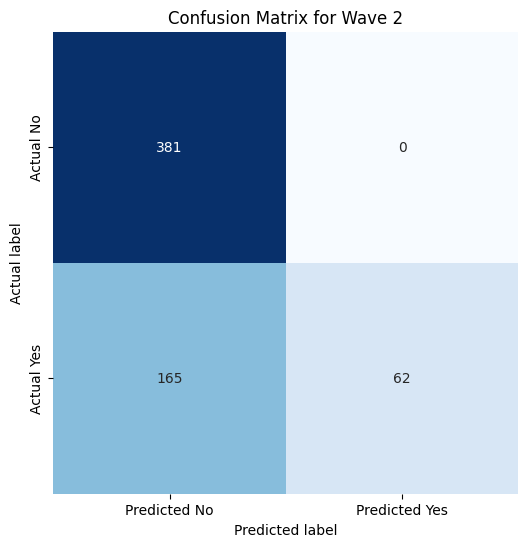

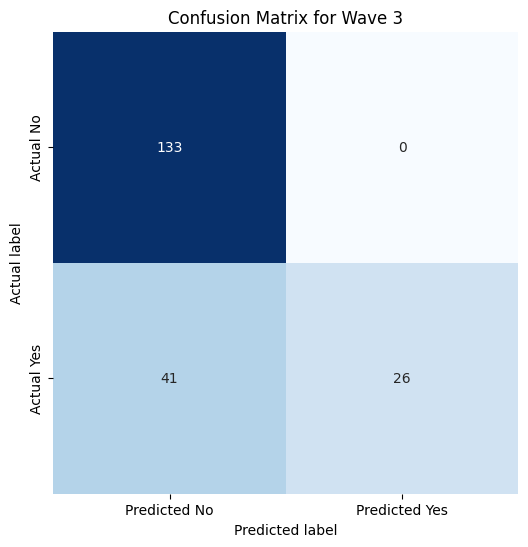

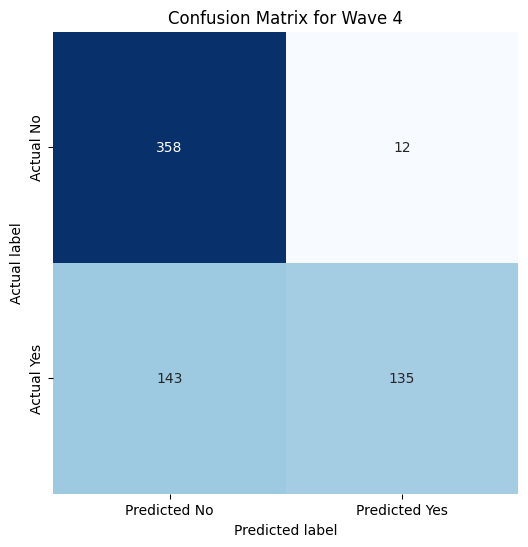

...

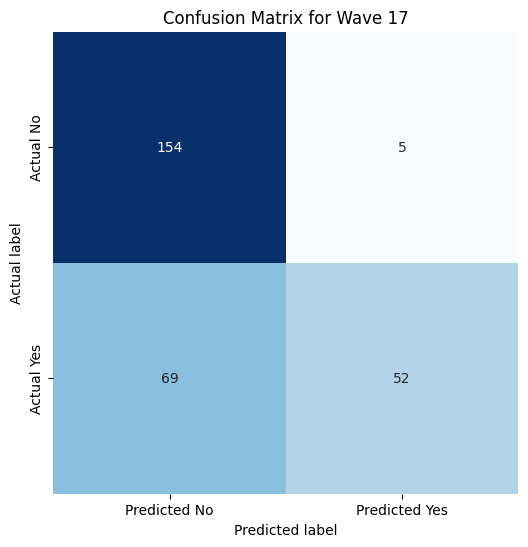

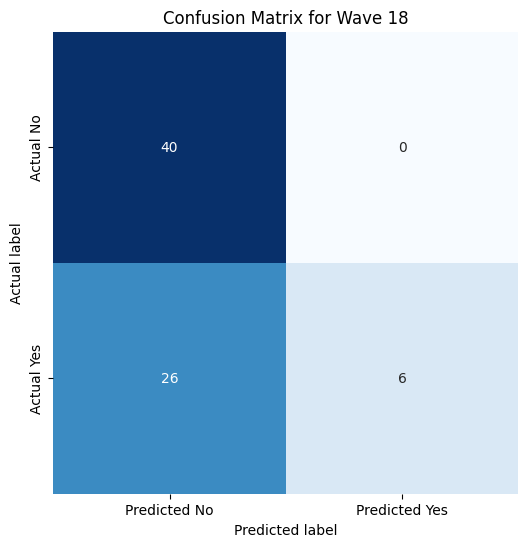

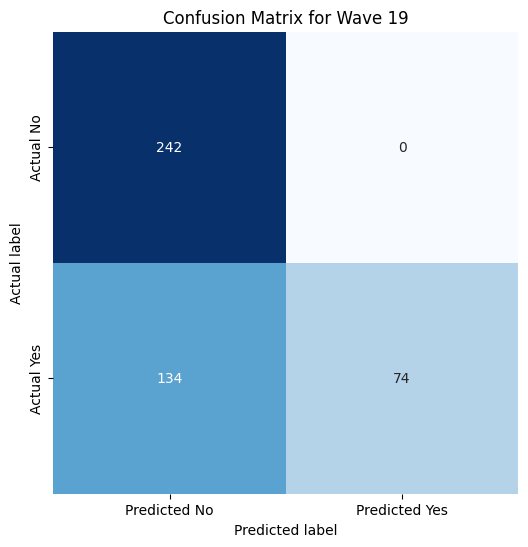

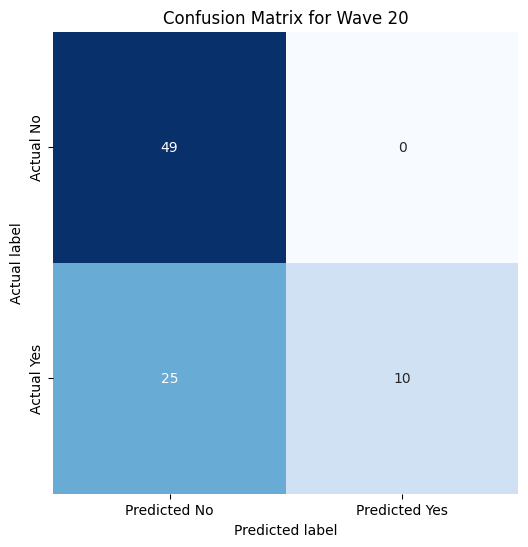

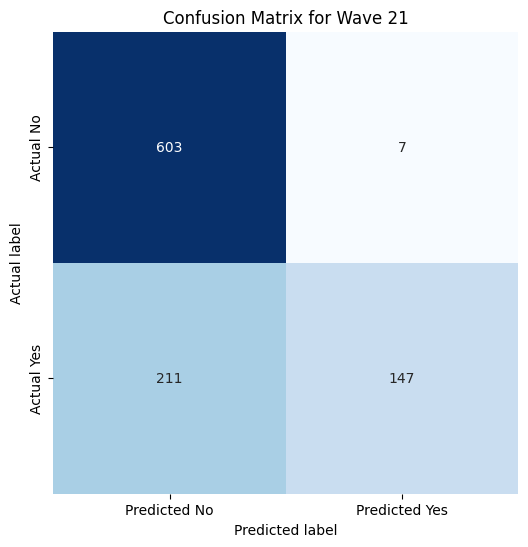

Classification Report for Wave 1:
              precision    recall  f1-score   support

           0       0.64      0.88      0.74        89
           1       0.86      0.60      0.71       111

    accuracy                           0.73       200
   macro avg       0.75      0.74      0.72       200
weighted avg       0.76      0.72      0.72       200


Classification Report for Wave 2:
              precision    recall  f1-score   support

           0       0.70      1.00      0.82       381
           1       1.00      0.27      0.43       227

    accuracy                           0.73       608
   macro avg       0.85      0.64      0.63       608
weighted avg       0.81      0.73      0.68       608


Classification Report for Wave 3:
              precision    recall  f1-score   support

           0       0.76      1.00      0.87       133
           1       1.00      0.39      0.56        67

    accuracy                           0.80       200
   macro avg       0.88 

In [ ]:
# @title Prediction by Wave and accuracy
wave_predictions = pd.DataFrame()
sum_predictions = []
classification_reports = []
confusion_matrices = []

for wave in train_data['wave'].unique():
  X_train = train_data[train_data['wave'] != wave].drop(['dec_o'], axis=1)
  y_train = train_data[train_data['wave'] != wave]['dec_o']
  X_val = train_data[train_data['wave'] == wave].drop(['dec_o'], axis=1)
  y_val = train_data[train_data['wave'] == wave]['dec_o']
  model = RandomForestClassifier(random_state=42)
#  model = xgb.XGBClassifier()
#  model = xgb.XGBRegressor()
  param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
  }
  grid_search = GridSearchCV(estimator=model, param_grid=param_grid,cv=5,
                             scoring='accuracy', n_jobs=-1)
  grid_search.fit(X_train, y_train)
  y_pred = grid_search.best_estimator_.predict(X_val)
  accuracy = accuracy_score(y_val, y_pred)
  f1 = f1_score(y_val, y_pred)
  wave_results = {
      'wave': wave,
      'Best_Parameters': grid_search.best_params_,
      'best_score': grid_search.best_score_,
      'accuracy': accuracy,
      'f1': f1
  }
  print(f'Wave {wave}: Accuracy = {accuracy}')
  sum_predictions.append(wave_results)

  # Compute confusion matrix and classification report
  cm = sklearn.metrics.confusion_matrix(y_val, y_pred)  # Use the sklearn function
  cr = sklearn.metrics.classification_report(y_val, y_pred)  # Use the sklearn function
  confusion_matrices.append((wave, cm))
  classification_reports.append((wave, cr))

sum_predictions = pd.DataFrame(sum_predictions)

plt.figure(figsize=(10, 6))
bars1 = plt.bar(sum_predictions['wave'],
                sum_predictions['accuracy'],
                label='Accuracy', alpha=0.7)
bars2 = plt.bar(sum_predictions['wave'] + 0.2,
                sum_predictions['best_score'],
                label='Best Score',
                alpha=0.7, width=0.4)

plt.xlabel('Wave')
plt.ylabel('Score')
plt.title('Accuracy and Best Score by Wave')
plt.grid(True)

for bar in bars1 + bars2:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2),
             va='bottom', ha='center')

plt.show()

# Plotting confusion matrices
for wave, cm in confusion_matrices:
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted No', 'Predicted Yes'],
                yticklabels=['Actual No', 'Actual Yes'])
    plt.title(f'Confusion Matrix for Wave {wave}')
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    plt.show()

# Printing classification reports
for wave, cr in classification_reports:
    print(f'Classification Report for Wave {wave}:\n{cr}\n')

## Does opposites attract to each others? (predict decision based on the differences in data)




In [ ]:
# @title DataFrame' my data

#creating new values
df.loc[:, 'att_diff']= abs(df['attr'] - df['attr_o'])
df.loc[:, 'sin_diff']= abs(df['sinc'] - df['sinc_o'])
df.loc[:, 'intel_diff']= abs(df['intel'] - df['intel_o'])
df.loc[:, 'fun_diff']= abs(df['fun'] - df['fun_o'])
df.loc[:, 'amb_diff']= abs(df['amb'] - df['amb_o'])

train_data = df.loc[:, ['iid', 'dec_o', 'match', 'int_corr', 'samerace',
                 'att_diff', 'sin_diff', 'intel_diff', 'fun_diff', 'amb_diff',
                 'imprace', 'imprelig','wave']]

In [ ]:
# @title Data Preprocessing
train_data.fillna(method='ffill', inplace=True)
if train_data.isnull().values.any():
    train_data.fillna(method='bfill', inplace=True)
label_encoders = {}
for column in train_data.select_dtypes(include=['object']).columns:
    label_encoders[column] = LabelEncoder()
    train_data[column] = label_encoders[column].fit_transform(train_data[column])

Wave 1: Accuracy = 0.745
Wave 2: Accuracy = 0.7286184210526315
Wave 3: Accuracy = 0.795
Wave 4: Accuracy = 0.7716049382716049
Wave 5: Accuracy = 0.8
Wave 6: Accuracy = 0.7
Wave 7: Accuracy = 0.73828125
Wave 8: Accuracy = 0.72
Wave 9: Accuracy = 0.7225
Wave 10: Accuracy = 0.6851851851851852
Wave 11: Accuracy = 0.746031746031746
Wave 13: Accuracy = 0.7
Wave 14: Accuracy = 0.7527777777777778
Wave 15: Accuracy = 0.72953216374269
Wave 16: Accuracy = 0.7916666666666666
Wave 17: Accuracy = 0.7357142857142858
Wave 18: Accuracy = 0.6388888888888888
Wave 19: Accuracy = 0.7022222222222222
Wave 20: Accuracy = 0.7023809523809523
Wave 21: Accuracy = 0.7789256198347108


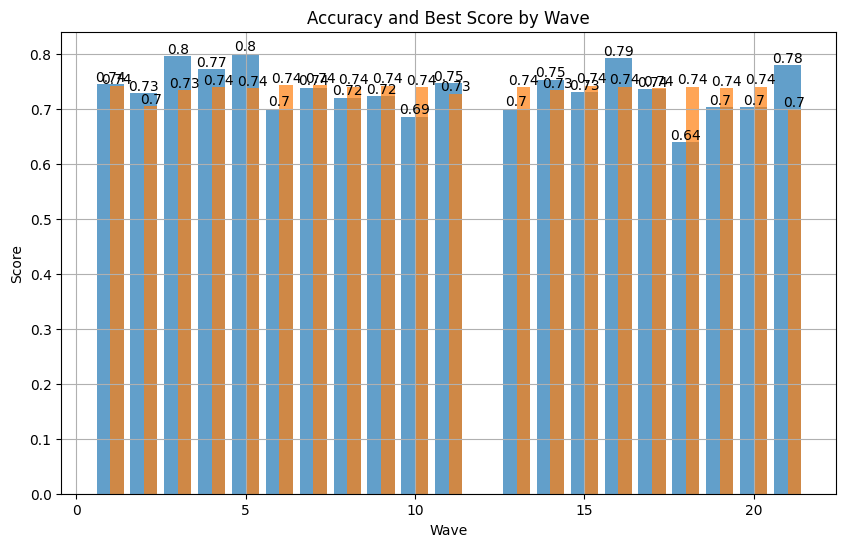

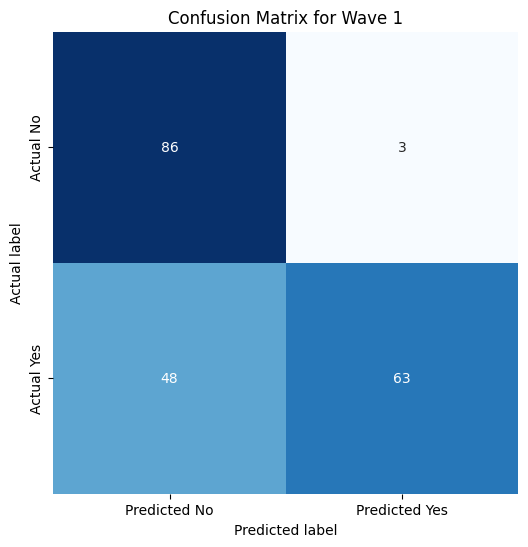

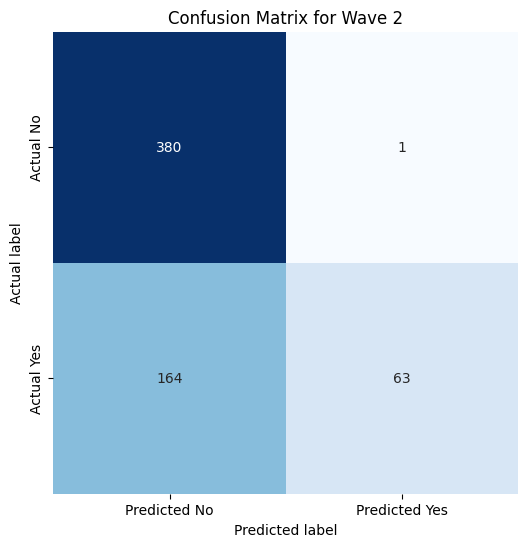

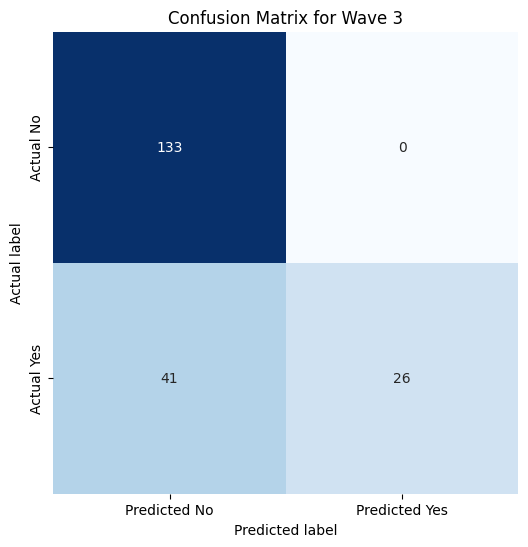

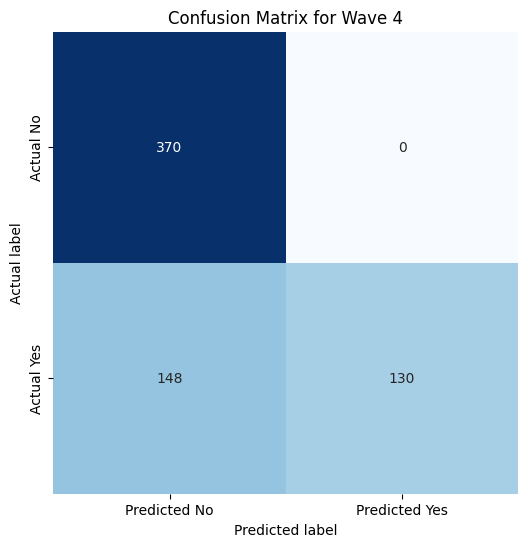

...

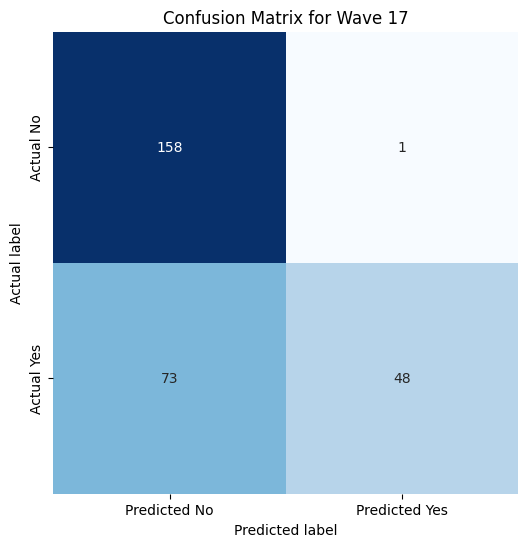

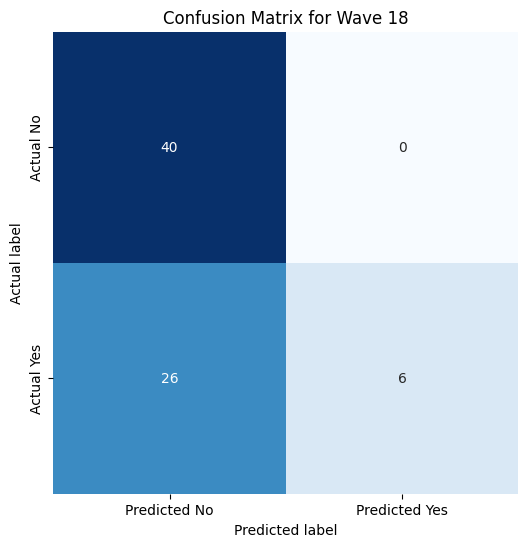

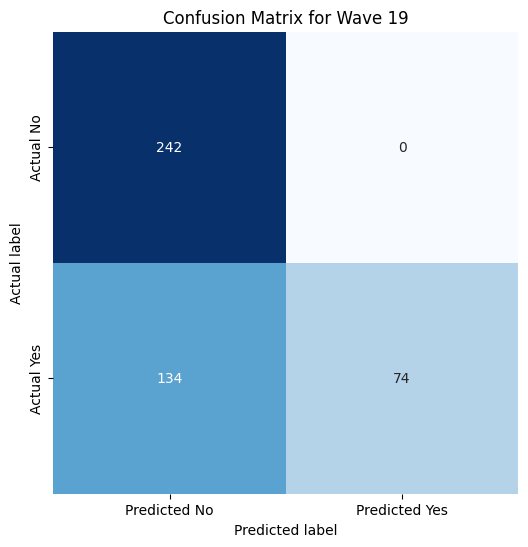

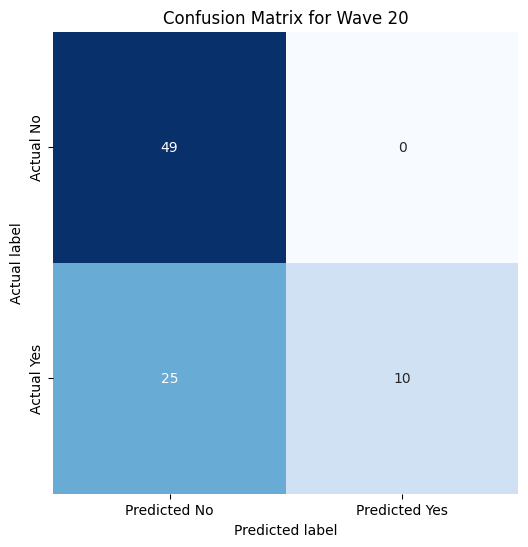

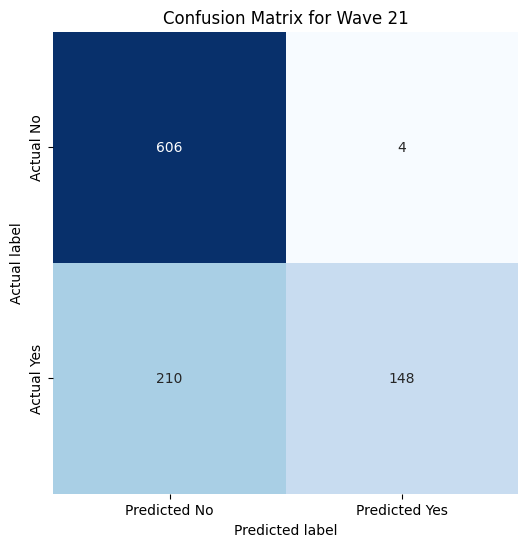

Classification Report for Wave 1:
              precision    recall  f1-score   support

           0       0.64      0.97      0.77        89
           1       0.95      0.57      0.71       111

    accuracy                           0.74       200
   macro avg       0.80      0.77      0.74       200
weighted avg       0.82      0.74      0.74       200


Classification Report for Wave 2:
              precision    recall  f1-score   support

           0       0.70      1.00      0.82       381
           1       0.98      0.28      0.43       227

    accuracy                           0.73       608
   macro avg       0.84      0.64      0.63       608
weighted avg       0.81      0.73      0.68       608


Classification Report for Wave 3:
              precision    recall  f1-score   support

           0       0.76      1.00      0.87       133
           1       1.00      0.39      0.56        67

    accuracy                           0.80       200
   macro avg       0.88 

In [ ]:
# @title Prediction by Wave and accuracy
wave_predictions = pd.DataFrame()
sum_predictions = []
classification_reports = []
confusion_matrices = []

for wave in train_data['wave'].unique():
  X_train = train_data[train_data['wave'] != wave].drop(['dec_o'], axis=1)
  y_train = train_data[train_data['wave'] != wave]['dec_o']
  X_val = train_data[train_data['wave'] == wave].drop(['dec_o'], axis=1)
  y_val = train_data[train_data['wave'] == wave]['dec_o']
  model = RandomForestClassifier(random_state=42)
#  model = xgb.XGBClassifier()
#  model = xgb.XGBRegressor()
  param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10]
  }
  grid_search = GridSearchCV(estimator=model, param_grid=param_grid,cv=5,
                             scoring='accuracy', n_jobs=-1)
  grid_search.fit(X_train, y_train)
  y_pred = grid_search.best_estimator_.predict(X_val)
  accuracy = accuracy_score(y_val, y_pred)
  f1 = f1_score(y_val, y_pred)
  wave_results = {
      'wave': wave,
      'Best_Parameters': grid_search.best_params_,
      'best_score': grid_search.best_score_,
      'accuracy': accuracy,
      'f1': f1
  }
  print(f'Wave {wave}: Accuracy = {accuracy}')
  sum_predictions.append(wave_results)


  cm = sklearn.metrics.confusion_matrix(y_val, y_pred)  # Use the sklearn function
  cr = sklearn.metrics.classification_report(y_val, y_pred)  # Use the sklearn function
  confusion_matrices.append((wave, cm))
  classification_reports.append((wave, cr))

sum_predictions = pd.DataFrame(sum_predictions)

plt.figure(figsize=(10, 6))
bars1 = plt.bar(sum_predictions['wave'],
                sum_predictions['accuracy'],
                label='Accuracy', alpha=0.7)
bars2 = plt.bar(sum_predictions['wave'] + 0.2,
                sum_predictions['best_score'],
                label='Best Score',
                alpha=0.7, width=0.4)

plt.xlabel('Wave')
plt.ylabel('Score')
plt.title('Accuracy and Best Score by Wave')
plt.grid(True)

for bar in bars1 + bars2:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, round(yval, 2), va='bottom', ha='center')

plt.show()

# Plotting confusion matrices
for wave, cm in confusion_matrices:
    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False,
                xticklabels=['Predicted No', 'Predicted Yes'],
                yticklabels=['Actual No', 'Actual Yes'])
    plt.title(f'Confusion Matrix for Wave {wave}')
    plt.ylabel('Actual label')
    plt.xlabel('Predicted label')
    plt.show()

# Printing classification reports
for wave, cr in classification_reports:
    print(f'Classification Report for Wave {wave}:\n{cr}\n')